# **I-GOOGLE ACCOUNT AUTHENTIFICATION**

In [1]:
from google.colab import auth
auth.authenticate_user()


# **II-IMPORT THE REQUIREMENTS LIBRARIES**

In [2]:
! pip install -q -U zarr xarray gcsfs
import xarray as xr
import gcsfs
import zarr
import pandas as pd
import matplotlib.pyplot as plt
# import cupy as cp
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.7/210.7 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.3/199.3 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 75.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.10.1 requires pyarrow<18.0.0a0,>=14.0.0, but you have pyarrow 21.0.0 which is incompatible.


In [3]:
# define the neuralgcm path data
era_5_path = 'gs://weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr'
#load the data
era5 = xr.open_zarr(era_5_path )

In [4]:
era5

<xarray.Dataset> Size: 89TB
Dimensions:                                           (time: 93544,
                                                       latitude: 721,
                                                       longitude: 1440,
                                                       level: 13)
Coordinates:
  * latitude                                          (latitude) float32 3kB ...
  * level                                             (level) int64 104B 50 ....
  * longitude                                         (longitude) float32 6kB ...
  * time                                              (time) datetime64[ns] 748kB ...
Data variables: (12/62)
    10m_u_component_of_wind                           (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    10m_v_component_of_wind                           (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    10m_wind_speed                                    (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    2m_dewpoint_temperature                           (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    2m_temperature                                    (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    above_ground                                      (time, level, latitude, longitude) float32 5TB dask.array<chunksize=(1, 13, 721, 1440), meta=np.ndarray>
    ...                                                ...
    volumetric_soil_water_layer_1                     (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    volumetric_soil_water_layer_2                     (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    volumetric_soil_water_layer_3                     (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    volumetric_soil_water_layer_4                     (time, latitude, longitude) float32 388GB dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    vorticity                                         (time, level, latitude, longitude) float32 5TB dask.array<chunksize=(1, 13, 721, 1440), meta=np.ndarray>
    wind_speed                                        (time, level, latitude, longitude) float32 5TB dask.array<chunksize=(1, 13, 721, 1440), meta=np.ndarray>

In [5]:
#display the variable
for var_name in era5.data_vars:
  # Access the variable using square bracket notation with the variable name string
  display(era5[var_name])


<xarray.DataArray '10m_u_component_of_wind' (time: 93544, latitude: 721,
                                             longitude: 1440)> Size: 388GB
dask.array<open_dataset-10m_u_component_of_wind, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   10 metre U wind component
    short_name:  u10
    units:       m s**-1

<xarray.DataArray '10m_v_component_of_wind' (time: 93544, latitude: 721,
                                             longitude: 1440)> Size: 388GB
dask.array<open_dataset-10m_v_component_of_wind, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   10 metre V wind component
    short_name:  v10
    units:       m s**-1

<xarray.DataArray '10m_wind_speed' (time: 93544, latitude: 721, longitude: 1440)> Size: 388GB
dask.array<open_dataset-10m_wind_speed, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray '2m_dewpoint_temperature' (time: 93544, latitude: 721,
                                             longitude: 1440)> Size: 388GB
dask.array<open_dataset-2m_dewpoint_temperature, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   2 metre dewpoint temperature
    short_name:  d2m
    units:       K

<xarray.DataArray '2m_temperature' (time: 93544, latitude: 721, longitude: 1440)> Size: 388GB
dask.array<open_dataset-2m_temperature, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   2 metre temperature
    short_name:  t2m
    units:       K

<xarray.DataArray 'above_ground' (time: 93544, level: 13, latitude: 721,
                                  longitude: 1440)> Size: 5TB
dask.array<open_dataset-above_ground, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'ageostrophic_wind_speed' (time: 93544, level: 13,
                                             latitude: 721, longitude: 1440)> Size: 5TB
dask.array<open_dataset-ageostrophic_wind_speed, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'angle_of_sub_gridscale_orography' (latitude: 721,
                                                      longitude: 1440)> Size: 4MB
dask.array<open_dataset-angle_of_sub_gridscale_orography, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Angle of sub-gridscale orography
    short_name:  anor
    units:       radians

<xarray.DataArray 'anisotropy_of_sub_gridscale_orography' (latitude: 721,
                                                           longitude: 1440)> Size: 4MB
dask.array<open_dataset-anisotropy_of_sub_gridscale_orography, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Anisotropy of sub-gridscale orography
    short_name:  isor
    units:       ~

<xarray.DataArray 'boundary_layer_height' (time: 93544, latitude: 721,
                                           longitude: 1440)> Size: 388GB
dask.array<open_dataset-boundary_layer_height, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Boundary layer height
    short_name:  blh
    units:       m

<xarray.DataArray 'divergence' (time: 93544, level: 13, latitude: 721,
                                longitude: 1440)> Size: 5TB
dask.array<open_dataset-divergence, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'eddy_kinetic_energy' (time: 93544, latitude: 721,
                                         longitude: 1440)> Size: 388GB
dask.array<open_dataset-eddy_kinetic_energy, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'geopotential' (time: 93544, level: 13, latitude: 721,
                                  longitude: 1440)> Size: 5TB
dask.array<open_dataset-geopotential, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Geopotential
    short_name:     z
    standard_name:  geopotential
    units:          m**2 s**-2

<xarray.DataArray 'geopotential_at_surface' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-geopotential_at_surface, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:      Geopotential
    short_name:     z
    standard_name:  geopotential
    units:          m**2 s**-2

<xarray.DataArray 'geostrophic_wind_speed' (time: 93544, level: 13,
                                            latitude: 721, longitude: 1440)> Size: 5TB
dask.array<open_dataset-geostrophic_wind_speed, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'high_vegetation_cover' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-high_vegetation_cover, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   High vegetation cover
    short_name:  cvh
    units:       (0 - 1)

<xarray.DataArray 'integrated_vapor_transport' (time: 93544, latitude: 721,
                                                longitude: 1440)> Size: 388GB
dask.array<open_dataset-integrated_vapor_transport, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'lake_cover' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-lake_cover, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Lake cover
    short_name:  cl
    units:       (0 - 1)

<xarray.DataArray 'land_sea_mask' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-land_sea_mask, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:      Land-sea mask
    short_name:     lsm
    standard_name:  land_binary_mask
    units:          (0 - 1)

<xarray.DataArray 'lapse_rate' (time: 93544, level: 13, latitude: 721,
                                longitude: 1440)> Size: 5TB
dask.array<open_dataset-lapse_rate, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'leaf_area_index_high_vegetation' (time: 93544,
                                                     latitude: 721,
                                                     longitude: 1440)> Size: 388GB
dask.array<open_dataset-leaf_area_index_high_vegetation, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Leaf area index, high vegetation
    short_name:  lai_hv
    units:       m**2 m**-2

<xarray.DataArray 'leaf_area_index_low_vegetation' (time: 93544, latitude: 721,
                                                    longitude: 1440)> Size: 388GB
dask.array<open_dataset-leaf_area_index_low_vegetation, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Leaf area index, low vegetation
    short_name:  lai_lv
    units:       m**2 m**-2

<xarray.DataArray 'low_vegetation_cover' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-low_vegetation_cover, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Low vegetation cover
    short_name:  cvl
    units:       (0 - 1)

<xarray.DataArray 'mean_sea_level_pressure' (time: 93544, latitude: 721,
                                             longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_sea_level_pressure, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Mean sea level pressure
    short_name:     msl
    standard_name:  air_pressure_at_mean_sea_level
    units:          Pa

<xarray.DataArray 'mean_surface_latent_heat_flux' (time: 93544, latitude: 721,
                                                   longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_surface_latent_heat_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface latent heat flux
    short_name:  mslhf
    units:       W m**-2

<xarray.DataArray 'mean_surface_net_long_wave_radiation_flux' (time: 93544,
                                                               latitude: 721,
                                                               longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_surface_net_long_wave_radiation_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface net long-wave radiation flux
    short_name:  msnlwrf
    units:       W m**-2

<xarray.DataArray 'mean_surface_net_short_wave_radiation_flux' (time: 93544,
                                                                latitude: 721,
                                                                longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_surface_net_short_wave_radiation_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface net short-wave radiation flux
    short_name:  msnswrf
    units:       W m**-2

<xarray.DataArray 'mean_surface_sensible_heat_flux' (time: 93544,
                                                     latitude: 721,
                                                     longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_surface_sensible_heat_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface sensible heat flux
    short_name:  msshf
    units:       W m**-2

<xarray.DataArray 'mean_top_downward_short_wave_radiation_flux' (time: 93544,
                                                                 latitude: 721,
                                                                 longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_top_downward_short_wave_radiation_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean top downward short-wave radiation flux
    short_name:  mtdwswrf
    units:       W m**-2

<xarray.DataArray 'mean_top_net_long_wave_radiation_flux' (time: 93544,
                                                           latitude: 721,
                                                           longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_top_net_long_wave_radiation_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean top net long-wave radiation flux
    short_name:  mtnlwrf
    units:       W m**-2

<xarray.DataArray 'mean_top_net_short_wave_radiation_flux' (time: 93544,
                                                            latitude: 721,
                                                            longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_top_net_short_wave_radiation_flux, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean top net short-wave radiation flux
    short_name:  mtnswrf
    units:       W m**-2

<xarray.DataArray 'mean_vertically_integrated_moisture_divergence' (
                                                                    time: 93544,
                                                                    latitude: 721,
                                                                    longitude: 1440)> Size: 388GB
dask.array<open_dataset-mean_vertically_integrated_moisture_divergence, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean vertically integrated moisture divergence
    short_name:  mvimd
    units:       kg m**-2 s**-1

<xarray.DataArray 'potential_vorticity' (time: 93544, level: 13, latitude: 721,
                                         longitude: 1440)> Size: 5TB
dask.array<open_dataset-potential_vorticity, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Potential vorticity
    short_name:  pv
    units:       K m**2 kg**-1 s**-1

<xarray.DataArray 'relative_humidity' (time: 93544, level: 13, latitude: 721,
                                       longitude: 1440)> Size: 5TB
dask.array<open_dataset-relative_humidity, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'sea_ice_cover' (time: 93544, latitude: 721, longitude: 1440)> Size: 388GB
dask.array<open_dataset-sea_ice_cover, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Sea ice area fraction
    short_name:     siconc
    standard_name:  sea_ice_area_fraction
    units:          (0 - 1)

<xarray.DataArray 'sea_surface_temperature' (time: 93544, latitude: 721,
                                             longitude: 1440)> Size: 388GB
dask.array<open_dataset-sea_surface_temperature, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Sea surface temperature
    short_name:  sst
    units:       K

<xarray.DataArray 'slope_of_sub_gridscale_orography' (latitude: 721,
                                                      longitude: 1440)> Size: 4MB
dask.array<open_dataset-slope_of_sub_gridscale_orography, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Slope of sub-gridscale orography
    short_name:  slor
    units:       ~

<xarray.DataArray 'snow_depth' (time: 93544, latitude: 721, longitude: 1440)> Size: 388GB
dask.array<open_dataset-snow_depth, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Snow depth
    short_name:     sd
    standard_name:  lwe_thickness_of_surface_snow_amount
    units:          m of water equivalent

<xarray.DataArray 'soil_type' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-soil_type, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Soil type
    short_name:  slt
    units:       ~

<xarray.DataArray 'specific_humidity' (time: 93544, level: 13, latitude: 721,
                                       longitude: 1440)> Size: 5TB
dask.array<open_dataset-specific_humidity, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Specific humidity
    short_name:     q
    standard_name:  specific_humidity
    units:          kg kg**-1

<xarray.DataArray 'standard_deviation_of_filtered_subgrid_orography' (
                                                                      latitude: 721,
                                                                      longitude: 1440)> Size: 4MB
dask.array<open_dataset-standard_deviation_of_filtered_subgrid_orography, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Standard deviation of filtered subgrid orography
    short_name:  sdfor
    units:       m

<xarray.DataArray 'standard_deviation_of_orography' (latitude: 721,
                                                     longitude: 1440)> Size: 4MB
dask.array<open_dataset-standard_deviation_of_orography, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Standard deviation of orography
    short_name:  sdor
    units:       m

<xarray.DataArray 'surface_pressure' (time: 93544, latitude: 721,
                                      longitude: 1440)> Size: 388GB
dask.array<open_dataset-surface_pressure, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Surface pressure
    short_name:     sp
    standard_name:  surface_air_pressure
    units:          Pa

<xarray.DataArray 'temperature' (time: 93544, level: 13, latitude: 721,
                                 longitude: 1440)> Size: 5TB
dask.array<open_dataset-temperature, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Temperature
    short_name:     t
    standard_name:  air_temperature
    units:          K

<xarray.DataArray 'total_cloud_cover' (time: 93544, latitude: 721,
                                       longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_cloud_cover, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Total cloud cover
    short_name:     tcc
    standard_name:  cloud_area_fraction
    units:          (0 - 1)

<xarray.DataArray 'total_column_vapor' (time: 93544, latitude: 721,
                                        longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_column_vapor, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'total_column_water' (time: 93544, latitude: 721,
                                        longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_column_water, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total column water
    short_name:  tcw
    units:       kg m**-2

<xarray.DataArray 'total_column_water_vapour' (time: 93544, latitude: 721,
                                               longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_column_water_vapour, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Total column vertically-integrated water vapour
    short_name:     tcwv
    standard_name:  lwe_thickness_of_atmosphere_mass_content_of_water_vapor
    units:          kg m**-2

<xarray.DataArray 'total_precipitation_12hr' (time: 93544, latitude: 721,
                                              longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_precipitation_12hr, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total precipitation
    short_name:  tp
    units:       m

<xarray.DataArray 'total_precipitation_24hr' (time: 93544, latitude: 721,
                                              longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_precipitation_24hr, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total precipitation
    short_name:  tp
    units:       m

<xarray.DataArray 'total_precipitation_6hr' (time: 93544, latitude: 721,
                                             longitude: 1440)> Size: 388GB
dask.array<open_dataset-total_precipitation_6hr, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total precipitation
    short_name:  tp
    units:       m

<xarray.DataArray 'type_of_high_vegetation' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-type_of_high_vegetation, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Type of high vegetation
    short_name:  tvh
    units:       ~

<xarray.DataArray 'type_of_low_vegetation' (latitude: 721, longitude: 1440)> Size: 4MB
dask.array<open_dataset-type_of_low_vegetation, shape=(721, 1440), dtype=float32, chunksize=(721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    long_name:   Type of low vegetation
    short_name:  tvl
    units:       ~

<xarray.DataArray 'u_component_of_wind' (time: 93544, level: 13, latitude: 721,
                                         longitude: 1440)> Size: 5TB
dask.array<open_dataset-u_component_of_wind, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      U component of wind
    short_name:     u
    standard_name:  eastward_wind
    units:          m s**-1

<xarray.DataArray 'v_component_of_wind' (time: 93544, level: 13, latitude: 721,
                                         longitude: 1440)> Size: 5TB
dask.array<open_dataset-v_component_of_wind, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      V component of wind
    short_name:     v
    standard_name:  northward_wind
    units:          m s**-1

<xarray.DataArray 'vertical_velocity' (time: 93544, level: 13, latitude: 721,
                                       longitude: 1440)> Size: 5TB
dask.array<open_dataset-vertical_velocity, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Vertical velocity
    short_name:     w
    standard_name:  lagrangian_tendency_of_air_pressure
    units:          Pa s**-1

<xarray.DataArray 'volumetric_soil_water_layer_1' (time: 93544, latitude: 721,
                                                   longitude: 1440)> Size: 388GB
dask.array<open_dataset-volumetric_soil_water_layer_1, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 1
    short_name:  swvl1
    units:       m**3 m**-3

<xarray.DataArray 'volumetric_soil_water_layer_2' (time: 93544, latitude: 721,
                                                   longitude: 1440)> Size: 388GB
dask.array<open_dataset-volumetric_soil_water_layer_2, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 2
    short_name:  swvl2
    units:       m**3 m**-3

<xarray.DataArray 'volumetric_soil_water_layer_3' (time: 93544, latitude: 721,
                                                   longitude: 1440)> Size: 388GB
dask.array<open_dataset-volumetric_soil_water_layer_3, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 3
    short_name:  swvl3
    units:       m**3 m**-3

<xarray.DataArray 'volumetric_soil_water_layer_4' (time: 93544, latitude: 721,
                                                   longitude: 1440)> Size: 388GB
dask.array<open_dataset-volumetric_soil_water_layer_4, shape=(93544, 721, 1440), dtype=float32, chunksize=(1, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 4
    short_name:  swvl4
    units:       m**3 m**-3

<xarray.DataArray 'vorticity' (time: 93544, level: 13, latitude: 721,
                               longitude: 1440)> Size: 5TB
dask.array<open_dataset-vorticity, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'wind_speed' (time: 93544, level: 13, latitude: 721,
                                longitude: 1440)> Size: 5TB
dask.array<open_dataset-wind_speed, shape=(93544, 13, 721, 1440), dtype=float32, chunksize=(1, 13, 721, 1440), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

In [ ]:
#the size of the era5 data
era5.nbytes/1e9

88963.00301054

# **Data Understanding**

In [6]:
era5.info()

xarray.Dataset {
dimensions:
	time = 93544 ;
	latitude = 721 ;
	longitude = 1440 ;
	level = 13 ;

variables:
	float32 10m_u_component_of_wind(time, latitude, longitude) ;
		10m_u_component_of_wind:long_name = 10 metre U wind component ;
		10m_u_component_of_wind:short_name = u10 ;
		10m_u_component_of_wind:units = m s**-1 ;
	float32 10m_v_component_of_wind(time, latitude, longitude) ;
		10m_v_component_of_wind:long_name = 10 metre V wind component ;
		10m_v_component_of_wind:short_name = v10 ;
		10m_v_component_of_wind:units = m s**-1 ;
	float32 10m_wind_speed(time, latitude, longitude) ;
	float32 2m_dewpoint_temperature(time, latitude, longitude) ;
		2m_dewpoint_temperature:long_name = 2 metre dewpoint temperature ;
		2m_dewpoint_temperature:short_name = d2m ;
		2m_dewpoint_temperature:units = K ;
	float32 2m_temperature(time, latitude, longitude) ;
		2m_temperature:long_name = 2 metre temperature ;
		2m_temperature:short_name = t2m ;
		2m_temperature:units = K ;
	float32 above_ground

In [ ]:
#the min and the max values of time in the global neural GCM
print(f"the min date is :",era5.time.min().values)
print(f"the max date is :",era5.time.max().values)

the min date is : 1959-01-01T00:00:00.000000000
the max date is : 2023-01-10T18:00:00.000000000


# **Era5 data for our domain**

# select the variables of interest:
*  Evaporation
*	Temperature
*	Geopotential
* 	Precipitation

* Specific_Cloud_Ice_Water_Content
*	Specific_Cloud_Liquid_Water_Content
* Specific_Humidity
*	U_Component_of_Wind
*	V_Component_of_Wind

In [7]:
#verify the slice of longitude and latidude
print(era5.coords['longitude'].min().values)
print(era5.coords['longitude'].max().values)
print(era5.coords['latitude'].min().values)
print(era5.coords['latitude'].max().values)

0.0
359.75
-90.0
90.0


In [8]:
era5_data_africa = era5.sel(
    latitude=slice(26 , -14),       #
    longitude=slice(19,55)       #
)


In [9]:
era5_data_africa

<xarray.Dataset> Size: 2TB
Dimensions:                                           (time: 93544,
                                                       latitude: 161,
                                                       longitude: 145, level: 13)
Coordinates:
  * latitude                                          (latitude) float32 644B ...
  * level                                             (level) int64 104B 50 ....
  * longitude                                         (longitude) float32 580B ...
  * time                                              (time) datetime64[ns] 748kB ...
Data variables: (12/62)
    10m_u_component_of_wind                           (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    10m_v_component_of_wind                           (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    10m_wind_speed                                    (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    2m_dewpoint_temperature                           (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    2m_temperature                                    (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    above_ground                                      (time, level, latitude, longitude) float32 114GB dask.array<chunksize=(1, 13, 161, 145), meta=np.ndarray>
    ...                                                ...
    volumetric_soil_water_layer_1                     (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_2                     (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_3                     (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_4                     (time, latitude, longitude) float32 9GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    vorticity                                         (time, level, latitude, longitude) float32 114GB dask.array<chunksize=(1, 13, 161, 145), meta=np.ndarray>
    wind_speed                                        (time, level, latitude, longitude) float32 114GB dask.array<chunksize=(1, 13, 161, 145), meta=np.ndarray>

In [10]:
!pip install cartopy

/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


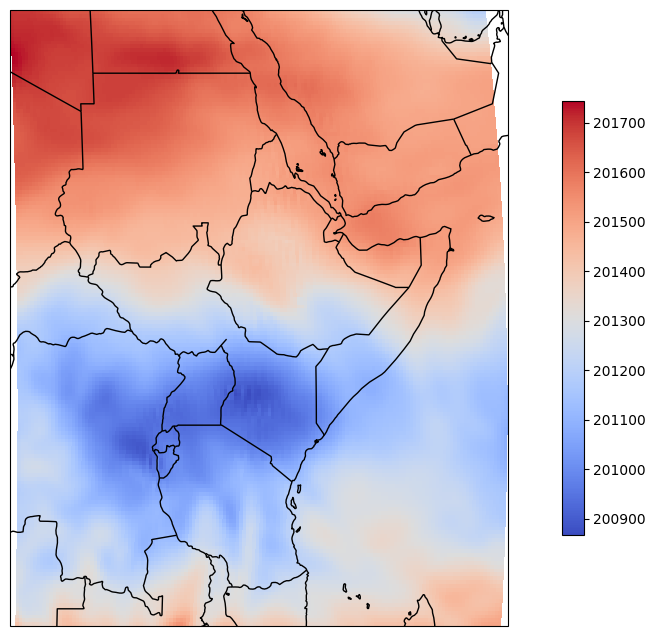

In [11]:
#cartopy using geopotential
#cartopy using surface pressure
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = era5_data_africa.longitude.values
lats = era5_data_africa.latitude.values
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
c = plt.pcolormesh(lons, lats,era5_data_africa.geopotential.isel({'time':0,'level':0}).values,transform=ccrs.PlateCarree(), cmap='coolwarm')

cb = plt.colorbar(c, fraction=0.02)

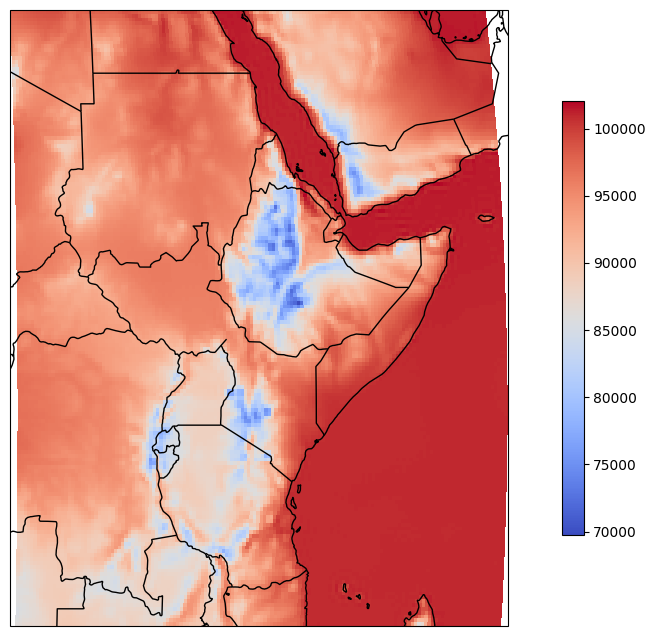

In [12]:
#cartopy using surface pressure
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = era5_data_africa.longitude.values
lats = era5_data_africa.latitude.values
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
c = plt.pcolormesh(lons, lats,era5_data_africa.surface_pressure.isel({'time':0,}).values,transform=ccrs.PlateCarree(), cmap='coolwarm')

cb = plt.colorbar(c, fraction=0.02)

In [13]:
#the size of the horn africa data in GO
era5_data_africa.nbytes/1e9

2000.3487305

In [14]:
for var_name in era5_data_africa.data_vars:
  # Access the variable using square bracket notation with the variable name string
  display(era5_data_africa[var_name])

<xarray.DataArray '10m_u_component_of_wind' (time: 93544, latitude: 161,
                                             longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   10 metre U wind component
    short_name:  u10
    units:       m s**-1

<xarray.DataArray '10m_v_component_of_wind' (time: 93544, latitude: 161,
                                             longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   10 metre V wind component
    short_name:  v10
    units:       m s**-1

<xarray.DataArray '10m_wind_speed' (time: 93544, latitude: 161, longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray '2m_dewpoint_temperature' (time: 93544, latitude: 161,
                                             longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   2 metre dewpoint temperature
    short_name:  d2m
    units:       K

<xarray.DataArray '2m_temperature' (time: 93544, latitude: 161, longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   2 metre temperature
    short_name:  t2m
    units:       K

<xarray.DataArray 'above_ground' (time: 93544, level: 13, latitude: 161,
                                  longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'ageostrophic_wind_speed' (time: 93544, level: 13,
                                             latitude: 161, longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'angle_of_sub_gridscale_orography' (latitude: 161,
                                                      longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Angle of sub-gridscale orography
    short_name:  anor
    units:       radians

<xarray.DataArray 'anisotropy_of_sub_gridscale_orography' (latitude: 161,
                                                           longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Anisotropy of sub-gridscale orography
    short_name:  isor
    units:       ~

<xarray.DataArray 'boundary_layer_height' (time: 93544, latitude: 161,
                                           longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Boundary layer height
    short_name:  blh
    units:       m

<xarray.DataArray 'divergence' (time: 93544, level: 13, latitude: 161,
                                longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'eddy_kinetic_energy' (time: 93544, latitude: 161,
                                         longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'geopotential' (time: 93544, level: 13, latitude: 161,
                                  longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Geopotential
    short_name:     z
    standard_name:  geopotential
    units:          m**2 s**-2

<xarray.DataArray 'geopotential_at_surface' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:      Geopotential
    short_name:     z
    standard_name:  geopotential
    units:          m**2 s**-2

<xarray.DataArray 'geostrophic_wind_speed' (time: 93544, level: 13,
                                            latitude: 161, longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'high_vegetation_cover' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   High vegetation cover
    short_name:  cvh
    units:       (0 - 1)

<xarray.DataArray 'integrated_vapor_transport' (time: 93544, latitude: 161,
                                                longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'lake_cover' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Lake cover
    short_name:  cl
    units:       (0 - 1)

<xarray.DataArray 'land_sea_mask' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:      Land-sea mask
    short_name:     lsm
    standard_name:  land_binary_mask
    units:          (0 - 1)

<xarray.DataArray 'lapse_rate' (time: 93544, level: 13, latitude: 161,
                                longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'leaf_area_index_high_vegetation' (time: 93544,
                                                     latitude: 161,
                                                     longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Leaf area index, high vegetation
    short_name:  lai_hv
    units:       m**2 m**-2

<xarray.DataArray 'leaf_area_index_low_vegetation' (time: 93544, latitude: 161,
                                                    longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Leaf area index, low vegetation
    short_name:  lai_lv
    units:       m**2 m**-2

<xarray.DataArray 'low_vegetation_cover' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Low vegetation cover
    short_name:  cvl
    units:       (0 - 1)

<xarray.DataArray 'mean_sea_level_pressure' (time: 93544, latitude: 161,
                                             longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Mean sea level pressure
    short_name:     msl
    standard_name:  air_pressure_at_mean_sea_level
    units:          Pa

<xarray.DataArray 'mean_surface_latent_heat_flux' (time: 93544, latitude: 161,
                                                   longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface latent heat flux
    short_name:  mslhf
    units:       W m**-2

<xarray.DataArray 'mean_surface_net_long_wave_radiation_flux' (time: 93544,
                                                               latitude: 161,
                                                               longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface net long-wave radiation flux
    short_name:  msnlwrf
    units:       W m**-2

<xarray.DataArray 'mean_surface_net_short_wave_radiation_flux' (time: 93544,
                                                                latitude: 161,
                                                                longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface net short-wave radiation flux
    short_name:  msnswrf
    units:       W m**-2

<xarray.DataArray 'mean_surface_sensible_heat_flux' (time: 93544,
                                                     latitude: 161,
                                                     longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean surface sensible heat flux
    short_name:  msshf
    units:       W m**-2

<xarray.DataArray 'mean_top_downward_short_wave_radiation_flux' (time: 93544,
                                                                 latitude: 161,
                                                                 longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean top downward short-wave radiation flux
    short_name:  mtdwswrf
    units:       W m**-2

<xarray.DataArray 'mean_top_net_long_wave_radiation_flux' (time: 93544,
                                                           latitude: 161,
                                                           longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean top net long-wave radiation flux
    short_name:  mtnlwrf
    units:       W m**-2

<xarray.DataArray 'mean_top_net_short_wave_radiation_flux' (time: 93544,
                                                            latitude: 161,
                                                            longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean top net short-wave radiation flux
    short_name:  mtnswrf
    units:       W m**-2

<xarray.DataArray 'mean_vertically_integrated_moisture_divergence' (
                                                                    time: 93544,
                                                                    latitude: 161,
                                                                    longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Mean vertically integrated moisture divergence
    short_name:  mvimd
    units:       kg m**-2 s**-1

<xarray.DataArray 'potential_vorticity' (time: 93544, level: 13, latitude: 161,
                                         longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Potential vorticity
    short_name:  pv
    units:       K m**2 kg**-1 s**-1

<xarray.DataArray 'relative_humidity' (time: 93544, level: 13, latitude: 161,
                                       longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'sea_ice_cover' (time: 93544, latitude: 161, longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Sea ice area fraction
    short_name:     siconc
    standard_name:  sea_ice_area_fraction
    units:          (0 - 1)

<xarray.DataArray 'sea_surface_temperature' (time: 93544, latitude: 161,
                                             longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Sea surface temperature
    short_name:  sst
    units:       K

<xarray.DataArray 'slope_of_sub_gridscale_orography' (latitude: 161,
                                                      longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Slope of sub-gridscale orography
    short_name:  slor
    units:       ~

<xarray.DataArray 'snow_depth' (time: 93544, latitude: 161, longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Snow depth
    short_name:     sd
    standard_name:  lwe_thickness_of_surface_snow_amount
    units:          m of water equivalent

<xarray.DataArray 'soil_type' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Soil type
    short_name:  slt
    units:       ~

<xarray.DataArray 'specific_humidity' (time: 93544, level: 13, latitude: 161,
                                       longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Specific humidity
    short_name:     q
    standard_name:  specific_humidity
    units:          kg kg**-1

<xarray.DataArray 'standard_deviation_of_filtered_subgrid_orography' (
                                                                      latitude: 161,
                                                                      longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Standard deviation of filtered subgrid orography
    short_name:  sdfor
    units:       m

<xarray.DataArray 'standard_deviation_of_orography' (latitude: 161,
                                                     longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Standard deviation of orography
    short_name:  sdor
    units:       m

<xarray.DataArray 'surface_pressure' (time: 93544, latitude: 161, longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Surface pressure
    short_name:     sp
    standard_name:  surface_air_pressure
    units:          Pa

<xarray.DataArray 'temperature' (time: 93544, level: 13, latitude: 161,
                                 longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Temperature
    short_name:     t
    standard_name:  air_temperature
    units:          K

<xarray.DataArray 'total_cloud_cover' (time: 93544, latitude: 161,
                                       longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Total cloud cover
    short_name:     tcc
    standard_name:  cloud_area_fraction
    units:          (0 - 1)

<xarray.DataArray 'total_column_vapor' (time: 93544, latitude: 161,
                                        longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'total_column_water' (time: 93544, latitude: 161,
                                        longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total column water
    short_name:  tcw
    units:       kg m**-2

<xarray.DataArray 'total_column_water_vapour' (time: 93544, latitude: 161,
                                               longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Total column vertically-integrated water vapour
    short_name:     tcwv
    standard_name:  lwe_thickness_of_atmosphere_mass_content_of_water_vapor
    units:          kg m**-2

<xarray.DataArray 'total_precipitation_12hr' (time: 93544, latitude: 161,
                                              longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total precipitation
    short_name:  tp
    units:       m

<xarray.DataArray 'total_precipitation_24hr' (time: 93544, latitude: 161,
                                              longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total precipitation
    short_name:  tp
    units:       m

<xarray.DataArray 'total_precipitation_6hr' (time: 93544, latitude: 161,
                                             longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Total precipitation
    short_name:  tp
    units:       m

<xarray.DataArray 'type_of_high_vegetation' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Type of high vegetation
    short_name:  tvh
    units:       ~

<xarray.DataArray 'type_of_low_vegetation' (latitude: 161, longitude: 145)> Size: 93kB
dask.array<getitem, shape=(161, 145), dtype=float32, chunksize=(161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
Attributes:
    long_name:   Type of low vegetation
    short_name:  tvl
    units:       ~

<xarray.DataArray 'u_component_of_wind' (time: 93544, level: 13, latitude: 161,
                                         longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      U component of wind
    short_name:     u
    standard_name:  eastward_wind
    units:          m s**-1

<xarray.DataArray 'v_component_of_wind' (time: 93544, level: 13, latitude: 161,
                                         longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      V component of wind
    short_name:     v
    standard_name:  northward_wind
    units:          m s**-1

<xarray.DataArray 'vertical_velocity' (time: 93544, level: 13, latitude: 161,
                                       longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:      Vertical velocity
    short_name:     w
    standard_name:  lagrangian_tendency_of_air_pressure
    units:          Pa s**-1

<xarray.DataArray 'volumetric_soil_water_layer_1' (time: 93544, latitude: 161,
                                                   longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 1
    short_name:  swvl1
    units:       m**3 m**-3

<xarray.DataArray 'volumetric_soil_water_layer_2' (time: 93544, latitude: 161,
                                                   longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 2
    short_name:  swvl2
    units:       m**3 m**-3

<xarray.DataArray 'volumetric_soil_water_layer_3' (time: 93544, latitude: 161,
                                                   longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 3
    short_name:  swvl3
    units:       m**3 m**-3

<xarray.DataArray 'volumetric_soil_water_layer_4' (time: 93544, latitude: 161,
                                                   longitude: 145)> Size: 9GB
dask.array<getitem, shape=(93544, 161, 145), dtype=float32, chunksize=(1, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00
Attributes:
    long_name:   Volumetric soil water layer 4
    short_name:  swvl4
    units:       m**3 m**-3

<xarray.DataArray 'vorticity' (time: 93544, level: 13, latitude: 161,
                               longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

<xarray.DataArray 'wind_speed' (time: 93544, level: 13, latitude: 161,
                                longitude: 145)> Size: 114GB
dask.array<getitem, shape=(93544, 13, 161, 145), dtype=float32, chunksize=(1, 13, 161, 145), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 644B 26.0 25.75 25.5 ... -13.5 -13.75 -14.0
  * level      (level) int64 104B 50 100 150 200 250 ... 600 700 850 925 1000
  * longitude  (longitude) float32 580B 19.0 19.25 19.5 ... 54.5 54.75 55.0
  * time       (time) datetime64[ns] 748kB 1959-01-01 ... 2023-01-10T18:00:00

# Homework :


*   cartoply
* correlation between evaporation, u-component of wind , geopotential and precipitation
*  all the previous task



# we can now selected the year between 2001-and 2021

In [15]:

import numpy as np

# Define the start date and end date
start_date = np.datetime64('2001-01-01T00:00:00.000000000')
end_date = start_date + np.timedelta64(7300, 'D') + np.timedelta64(24, 'h')

# Select data within the date range
era5_selected = era5_data_africa.sel(time=slice(start_date, end_date))

print(f"Selected data between {start_date} and {end_date}")
era5_selected


Selected data between 2001-01-01T00:00:00.000000000 and 2020-12-28T00:00:00.000000000


<xarray.Dataset> Size: 625GB
Dimensions:                                           (time: 29205,
                                                       latitude: 161,
                                                       longitude: 145, level: 13)
Coordinates:
  * latitude                                          (latitude) float32 644B ...
  * level                                             (level) int64 104B 50 ....
  * longitude                                         (longitude) float32 580B ...
  * time                                              (time) datetime64[ns] 234kB ...
Data variables: (12/62)
    10m_u_component_of_wind                           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    10m_v_component_of_wind                           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    10m_wind_speed                                    (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    2m_dewpoint_temperature                           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    2m_temperature                                    (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    above_ground                                      (time, level, latitude, longitude) float32 35GB dask.array<chunksize=(1, 13, 161, 145), meta=np.ndarray>
    ...                                                ...
    volumetric_soil_water_layer_1                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_2                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_3                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_4                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    vorticity                                         (time, level, latitude, longitude) float32 35GB dask.array<chunksize=(1, 13, 161, 145), meta=np.ndarray>
    wind_speed                                        (time, level, latitude, longitude) float32 35GB dask.array<chunksize=(1, 13, 161, 145), meta=np.ndarray>

# **observations:**


*   The time interval of ERA5 is already 6 hours.





In [16]:
era5_selected.nbytes/1e9

624.521753008

In [17]:
print(era5_selected.info())

xarray.Dataset {
dimensions:
	time = 29205 ;
	latitude = 161 ;
	longitude = 145 ;
	level = 13 ;

variables:
	float32 10m_u_component_of_wind(time, latitude, longitude) ;
		10m_u_component_of_wind:long_name = 10 metre U wind component ;
		10m_u_component_of_wind:short_name = u10 ;
		10m_u_component_of_wind:units = m s**-1 ;
	float32 10m_v_component_of_wind(time, latitude, longitude) ;
		10m_v_component_of_wind:long_name = 10 metre V wind component ;
		10m_v_component_of_wind:short_name = v10 ;
		10m_v_component_of_wind:units = m s**-1 ;
	float32 10m_wind_speed(time, latitude, longitude) ;
	float32 2m_dewpoint_temperature(time, latitude, longitude) ;
		2m_dewpoint_temperature:long_name = 2 metre dewpoint temperature ;
		2m_dewpoint_temperature:short_name = d2m ;
		2m_dewpoint_temperature:units = K ;
	float32 2m_temperature(time, latitude, longitude) ;
		2m_temperature:long_name = 2 metre temperature ;
		2m_temperature:short_name = t2m ;
		2m_temperature:units = K ;
	float32 above_ground(

In [18]:
# Sélect one level and one surface(surface=1, level=0)
level=850
ds_subset = era5_selected.sel(level=level)
ds_subset

<xarray.Dataset> Size: 134GB
Dimensions:                                           (time: 29205,
                                                       latitude: 161,
                                                       longitude: 145)
Coordinates:
  * latitude                                          (latitude) float32 644B ...
    level                                             int64 8B 850
  * longitude                                         (longitude) float32 580B ...
  * time                                              (time) datetime64[ns] 234kB ...
Data variables: (12/62)
    10m_u_component_of_wind                           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    10m_v_component_of_wind                           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    10m_wind_speed                                    (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    2m_dewpoint_temperature                           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    2m_temperature                                    (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    above_ground                                      (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    ...                                                ...
    volumetric_soil_water_layer_1                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_2                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_3                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    volumetric_soil_water_layer_4                     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    vorticity                                         (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    wind_speed                                        (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>

In [19]:
selected_variables= [
    'geopotential',
    'total_precipitation_6hr',
    'specific_humidity',
    'temperature',
    'u_component_of_wind',
    'v_component_of_wind' ,
    'integrated_vapor_transport'
]
ds_subset_specific = ds_subset[selected_variables]
ds_subset_specific

<xarray.Dataset> Size: 19GB
Dimensions:                     (time: 29205, latitude: 161, longitude: 145)
Coordinates:
  * latitude                    (latitude) float32 644B 26.0 25.75 ... -14.0
    level                       int64 8B 850
  * longitude                   (longitude) float32 580B 19.0 19.25 ... 55.0
  * time                        (time) datetime64[ns] 234kB 2001-01-01 ... 20...
Data variables:
    geopotential                (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    total_precipitation_6hr     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    specific_humidity           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    temperature                 (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    u_component_of_wind         (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    v_component_of_wind         (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    integrated_vapor_transport  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>

In [20]:
ds_subset_specific.nbytes/1e9

19.090375172

In [21]:
# Définir le device (GPU si disponible, sinon CPU)
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [22]:
ds_subset_specific.time.dt.year

<xarray.DataArray 'year' (time: 29205)> Size: 234kB
array([2001, 2001, 2001, ..., 2020, 2020, 2020])
Coordinates:
    level    int64 8B 850
  * time     (time) datetime64[ns] 234kB 2001-01-01 ... 2020-12-28

In [23]:
small_data=ds_subset_specific
small_data

<xarray.Dataset> Size: 19GB
Dimensions:                     (time: 29205, latitude: 161, longitude: 145)
Coordinates:
  * latitude                    (latitude) float32 644B 26.0 25.75 ... -14.0
    level                       int64 8B 850
  * longitude                   (longitude) float32 580B 19.0 19.25 ... 55.0
  * time                        (time) datetime64[ns] 234kB 2001-01-01 ... 20...
Data variables:
    geopotential                (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    total_precipitation_6hr     (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    specific_humidity           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    temperature                 (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    u_component_of_wind         (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    v_component_of_wind         (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    integrated_vapor_transport  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>

# correlation plot

In [24]:
from datetime import time

import xarray as xr
import pandas as pd


# Step 3: Filter for 2018 and then group by month
year_2018_data = small_data.sel(time=slice('2018-01-01', '2018-12-31'))
monthly_mean_2018 = year_2018_data.groupby('time.month').mean(dim='time')

# Result
monthly_mean_2018

<xarray.Dataset> Size: 8MB
Dimensions:                     (month: 12, latitude: 161, longitude: 145)
Coordinates:
  * latitude                    (latitude) float32 644B 26.0 25.75 ... -14.0
    level                       int64 8B 850
  * longitude                   (longitude) float32 580B 19.0 19.25 ... 55.0
  * month                       (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    geopotential                (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    total_precipitation_6hr     (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    specific_humidity           (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    temperature                 (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    u_component_of_wind         (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    v_component_of_wind         (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>
    integrated_vapor_transport  (month, latitude, longitude) float32 1MB dask.array<chunksize=(1, 161, 145), meta=np.ndarray>

In [ ]:
# import matplotlib.pyplot as plt
# from matplotlib.colors import LogNorm
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature
# import numpy as np
# import xarray as xr  # Ensure xarray is imported

# variable = "temperature"
# fig = plt.figure(figsize=(14, 8))
# ax = plt.axes(projection=ccrs.Robinson())

# lons = monthly_mean_2018.longitude.values
# lats = monthly_mean_2018.latitude.values
# print(f"Longitude shape: {lons.shape}")
# print(f"Latitude shape: {lats.shape}")

# ax.coastlines()
# ax.add_feature(cfeature.BORDERS, linewidth=1)

# # Compute the correlation
# correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
# print(f"Correlation shape: {correlation.shape}")

# # Use shading='auto' or 'nearest' to match dimensions
# c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm', shading='nearest')

# cb = plt.colorbar(c, fraction=0.02)
# ax.set_title(f'Correlation of {variable} with precipitation')
# plt.show()

Longitude shape: (145,)
Latitude shape: (161,)


Text(0.5, 1.0, 'Correlation of temperature_level_pressure_850 with precipitation')

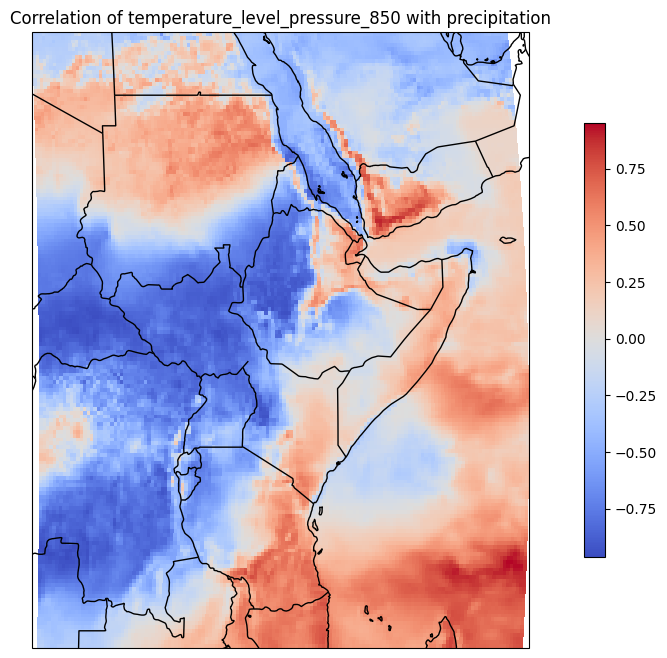

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="temperature"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = monthly_mean_2018.longitude.values
lats = monthly_mean_2018.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
correlation
c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable}_level_pressure_{level} with precipitation')

Longitude shape: (145,)
Latitude shape: (161,)


Text(0.5, 1.0, 'Correlation of integrated_vapor_transport_level_pressure_850 with precipitation')

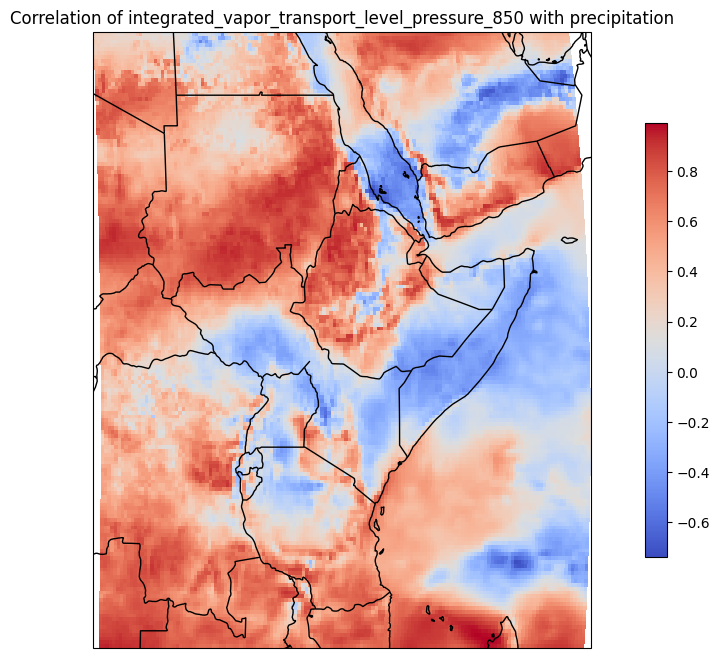

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="integrated_vapor_transport"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = monthly_mean_2018.longitude.values
lats = monthly_mean_2018.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
correlation
c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable}_level_pressure_{level} with precipitation')

Longitude shape: (145,)
Latitude shape: (161,)


Text(0.5, 1.0, 'Correlation of geopotential_level_pressure_850 with precipitation')

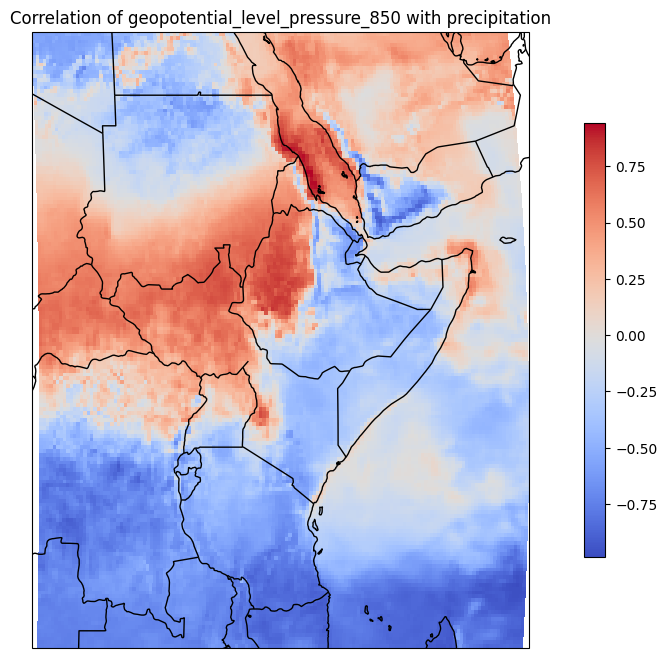

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="geopotential"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = monthly_mean_2018.longitude.values
lats = monthly_mean_2018.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
correlation
c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable}_level_pressure_{level} with precipitation')

Longitude shape: (145,)
Latitude shape: (161,)


Text(0.5, 1.0, 'Correlation of specific_humidity_level_pressure_850 with precipitation')

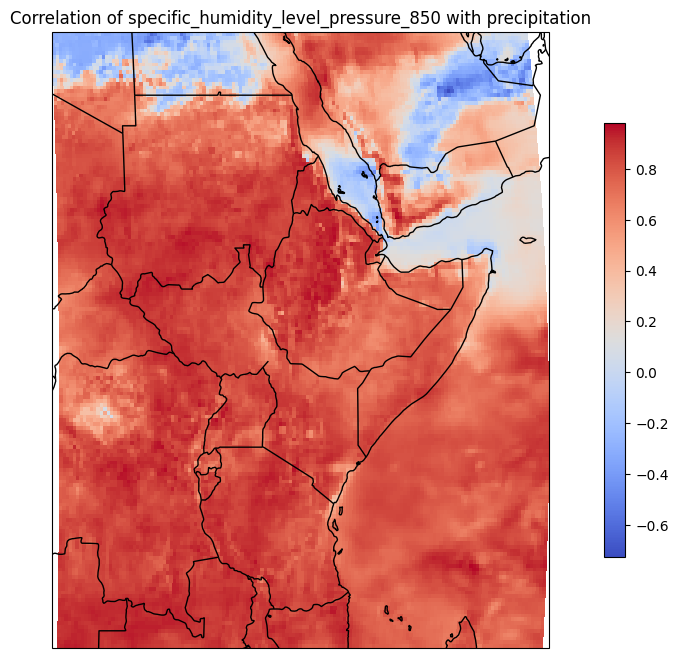

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="specific_humidity"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = monthly_mean_2018.longitude.values
lats = monthly_mean_2018.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
correlation
c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable}_level_pressure_{level} with precipitation')

Longitude shape: (145,)
Latitude shape: (161,)


Text(0.5, 1.0, 'Correlation of u_component_of_wind_level_pressure_850 with precipitation')

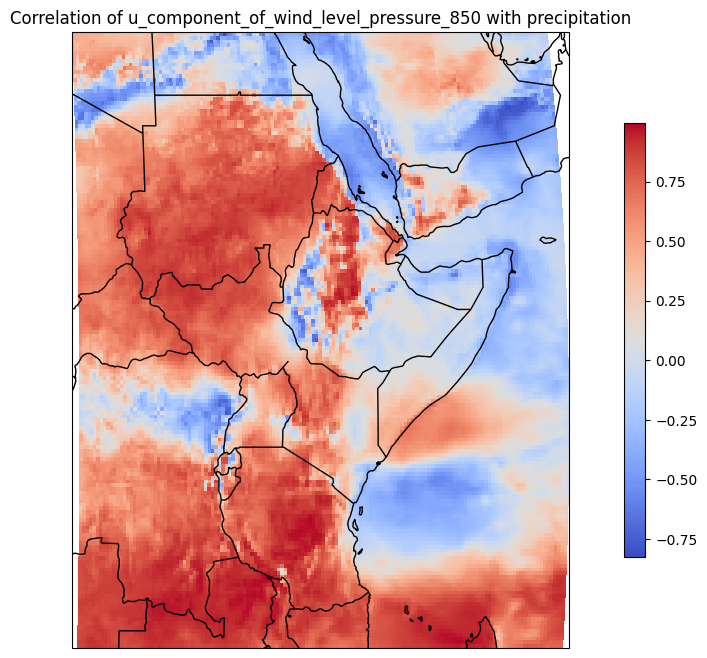

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="u_component_of_wind"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = monthly_mean_2018.longitude.values
lats = monthly_mean_2018.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
correlation
c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable}_level_pressure_{level} with precipitation')

Longitude shape: (145,)
Latitude shape: (161,)


Text(0.5, 1.0, 'Correlation of v_component_of_wind_level_pressure_850 with precipitation')

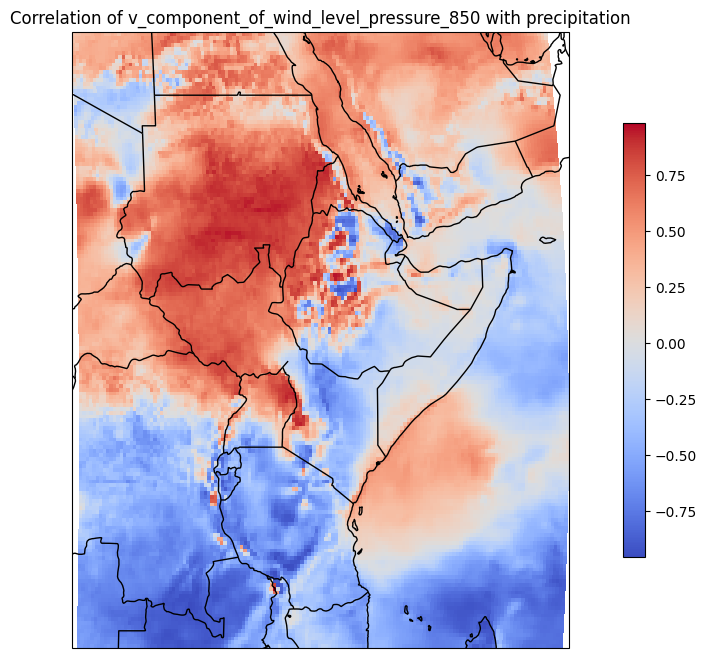

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="v_component_of_wind"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = monthly_mean_2018.longitude.values
lats = monthly_mean_2018.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(monthly_mean_2018['total_precipitation_6hr'], monthly_mean_2018[variable], dim='month').values
correlation
c = plt.pcolormesh(lons, lats, correlation, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable}_level_pressure_{level} with precipitation')

In [ ]:
# small_data['total_precipitation_6hr'][1].values

In [ ]:
# small_data.geopotential.groupby(small_data.time.dt.year)

In [ ]:
#compute the group of variable per year
# evaporation_group_year = small_data.evaporation.groupby(small_data.date.dt.year)
temperature_group_year = small_data.temperature.groupby(small_data.time.dt.year)
geopotential_group_year= small_data.geopotential.groupby(small_data.time.dt.year)
precipitation_cumulative_mean_group_year= small_data.total_precipitation_6hr.groupby(small_data.time.dt.year)
# specific_cloud_ice_water_content_group_year= small_data.specific_cloud_ice_water_content.groupby(small_data.time.dt.year)
# specific_cloud_liquid_water_content_group_year= small_data.specific_cloud_liquid_water_content.groupby(small_data.time.dt.year)
# specific_humidity_group_year= small_data.specific_humidity.groupby(small_data.time.dt.year)
u_component_of_wind_group_year= small_data.u_component_of_wind.groupby(small_data.time.dt.year)
v_component_of_wind_group_year= small_data.v_component_of_wind.groupby(small_data.time.dt.year)
integrated_vapor_transport_group_year= small_data.integrated_vapor_transport.groupby(small_data.time.dt.year)

In [ ]:
import tqdm

evaporation_mean_year = []
years = range(2001, 2021)
years

range(2001, 2021)

In [ ]:
import tqdm
# Create a list to store the years
years = list(range(2001, 2021))

In [ ]:
import tqdm
# Create a list to store the years
years = list(range(2001, 2021))

# Create empty lists to store the mean values for each variable
temperature_mean = []
geopotential_mean = []
precipitation_mean = []
u_component_of_wind_mean = []
v_component_of_wind_mean= []
integrated_vapor_transport_mean = []


# Assuming evaporation_group_year, etc., are defined as in your provided code
for year_index in tqdm.tqdm(years):
    temperature_mean.append(temperature_group_year[year_index].mean(dim=('time')))
    geopotential_mean.append(geopotential_group_year[year_index].mean(dim=('time')))
    precipitation_mean.append(precipitation_cumulative_mean_group_year[year_index].mean(dim=('time')))
    u_component_of_wind_mean.append(u_component_of_wind_group_year[year_index].mean(dim=('time')))
    v_component_of_wind_mean.append(v_component_of_wind_group_year[year_index].mean(dim=('time')))
    integrated_vapor_transport_mean.append(integrated_vapor_transport_group_year[year_index].mean(dim=('time')))




100%|██████████| 20/20 [00:26<00:00,  1.32s/it]


In [ ]:
# prompt: transforme tout ca en xarray

import xarray as xr

# Assuming temperature_mean, geopotential_mean, etc., are lists of xarray.DataArrays
# and years is a list of years

# Create dictionaries to store the data variables
data_vars = {
    'temperature': (['year', 'latitude', 'longitude'], np.stack([arr.values for arr in temperature_mean])),
    'geopotential': (['year', 'latitude', 'longitude'], np.stack([arr.values for arr in geopotential_mean])),
    'total_precipitation_6hr': (['year', 'latitude', 'longitude'], np.stack([arr.values for arr in precipitation_mean])),
    'u_component_of_wind': (['year', 'latitude', 'longitude'], np.stack([arr.values for arr in u_component_of_wind_mean])),
    'v_component_of_wind': (['year', 'latitude', 'longitude'], np.stack([arr.values for arr in v_component_of_wind_mean])),
    'integrated_vapor_transport': (['year', 'latitude', 'longitude'], np.stack([arr.values for arr in integrated_vapor_transport_mean])),
}

# Create coordinates
coords = {
    'year': years,
    'latitude': temperature_mean[0].latitude,  # Assuming all DataArrays have the same coordinates
    'longitude': temperature_mean[0].longitude,
}

# Create the xarray.Dataset
ds_combined = xr.Dataset(data_vars=data_vars, coords=coords)

# Print the combined dataset
ds_combined

KeyboardInterrupt: 

In [ ]:

# # Create a dictionary to store the mean variables
# mean_vars = {
#     'temperature': temperature_mean,
#     'geopotential': geopotential_mean,
#     'precipitation_cumulative_mean': precipitation_mean,
#     'u_component_of_wind': u_component_of_wind_mean,
#     'v_component_of_wind': v_component_of_wind_mean,
#     # 'integrated_vapor_transport': integrated_vapor_transport_mean
# }

# # Create the dataset
# mean_dataset = xr.Dataset(mean_vars)

# # Print the resulting dataset
# mean_dataset

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="temperature"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = .longitude.values
lats = mean_dataset.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(mean_dataset['precipitation_cumulative_mean'], mean_dataset[variable], dim='year').values
correlation
c = plt.pcolormesh(lons, lats, correlation.T, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable} with precipitation')

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="geopotential"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = mean_dataset.longitude.values
lats = mean_dataset.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(mean_dataset['precipitation_cumulative_mean'], mean_dataset[variable], dim='year').values
correlation
c = plt.pcolormesh(lons, lats, correlation.T, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable} with precipitation')

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
variable="u_component_of_wind"
fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = mean_dataset.longitude.values
lats = mean_dataset.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# # Compute the correlation
correlation = xr.corr(mean_dataset['precipitation_cumulative_mean'], mean_dataset[variable], dim='year').values
correlation
c = plt.pcolormesh(lons, lats, correlation.T, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)
ax.set_title(f'Correlation of {variable} with precipitation')

In [ ]:
#Create the DataFrame
df = pd.DataFrame({
    'Year': years,
    'Temperature': temperature_mean,
    'Geopotential': geopotential_mean,
    'Precipitation': precipitation_mean,
    'U_Component_of_Wind': u_component_of_wind_mean,
    'V_Component_of_Wind': v_component_of_wind_mean,
    'Integrated_Vapor_Transport': integrated_vapor_transport_mean
})

df

,Year,Temperature,Geopotential,Precipitation,U_Component_of_Wind,V_Component_of_Wind,Integrated_Vapor_Transport
0,2001,266.946075,57479.078125,0.000471,-1.092786,-0.336011,1.343066
1,2002,267.099243,57521.871094,0.000502,-0.789459,-0.386606,1.429685
2,2003,267.129852,57537.304688,0.000475,-0.942614,-0.168983,1.428000
3,2004,266.897430,57507.296875,0.000480,-0.842659,-0.543110,1.416063
4,2005,267.228577,57537.667969,0.000456,-0.836676,-0.372375,1.375331
5,2006,267.040466,57508.890625,0.000563,-0.932990,-0.373652,1.449961
6,2007,267.122131,57505.613281,0.000484,-1.191295,-0.427034,1.476015
7,2008,266.921722,57455.160156,0.000477,-1.379220,-0.267214,1.392887
8,2009,267.074249,57523.492188,0.000464,-1.158970,-0.459465,1.381245
9,2010,267.390442,57552.738281,0.000485,-0.970283,-0.504819,1.440954


In [ ]:
from google.colab import files
df.to_csv('era5_mean_6H_variables.csv', encoding = 'utf-8-sig')
files.download('era5_mean_6H_variables.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
# Load the dataframe from the CSV file
df = pd.read_csv('era5_mean_6H_variables.csv')
#remove the index column if present
df = df.drop(df.columns[0], axis=1)
df

,Year,Temperature,Geopotential,Precipitation,U_Component_of_Wind,V_Component_of_Wind,Integrated_Vapor_Transport
0,2001,266.946075,57479.078125,0.000471,-1.092786,-0.336011,1.343066
1,2002,267.099243,57521.871094,0.000502,-0.789459,-0.386606,1.429685
2,2003,267.129852,57537.304688,0.000475,-0.942614,-0.168983,1.428000
3,2004,266.897430,57507.296875,0.000480,-0.842659,-0.543110,1.416063
4,2005,267.228577,57537.667969,0.000456,-0.836676,-0.372375,1.375331
5,2006,267.040466,57508.890625,0.000563,-0.932990,-0.373652,1.449961
6,2007,267.122131,57505.613281,0.000484,-1.191295,-0.427034,1.476015
7,2008,266.921722,57455.160156,0.000477,-1.379220,-0.267214,1.392887
8,2009,267.074249,57523.492188,0.000464,-1.158970,-0.459465,1.381245
9,2010,267.390442,57552.738281,0.000485,-0.970283,-0.504819,1.440954



GENERATING PLOTS

Processing variable: Temperature


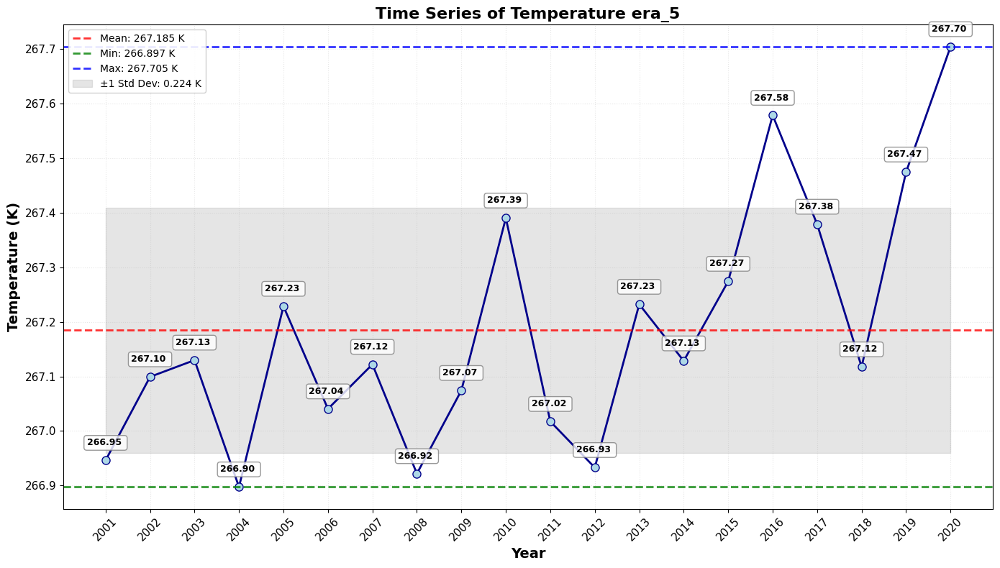


Processing variable: Geopotential


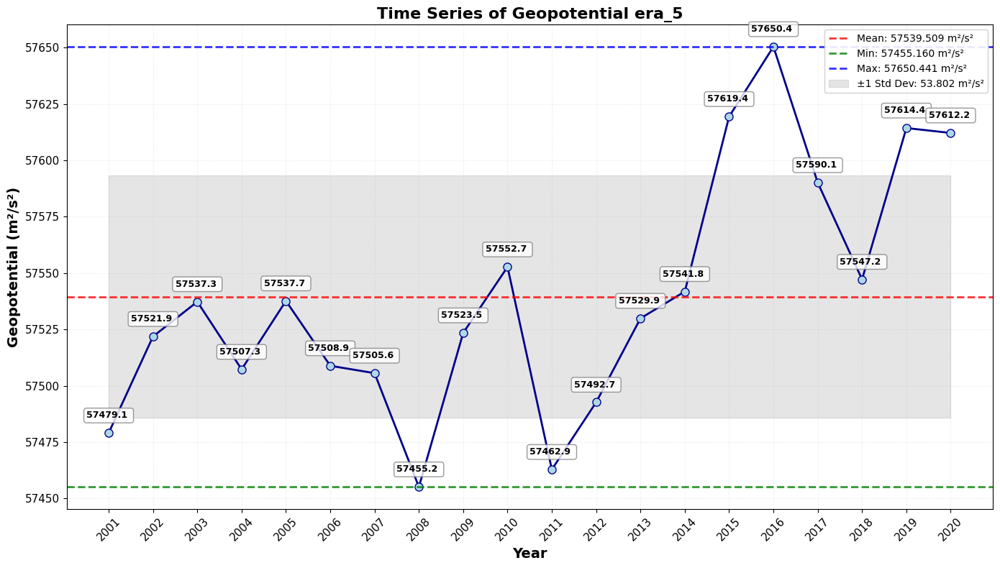


Processing variable: Precipitation


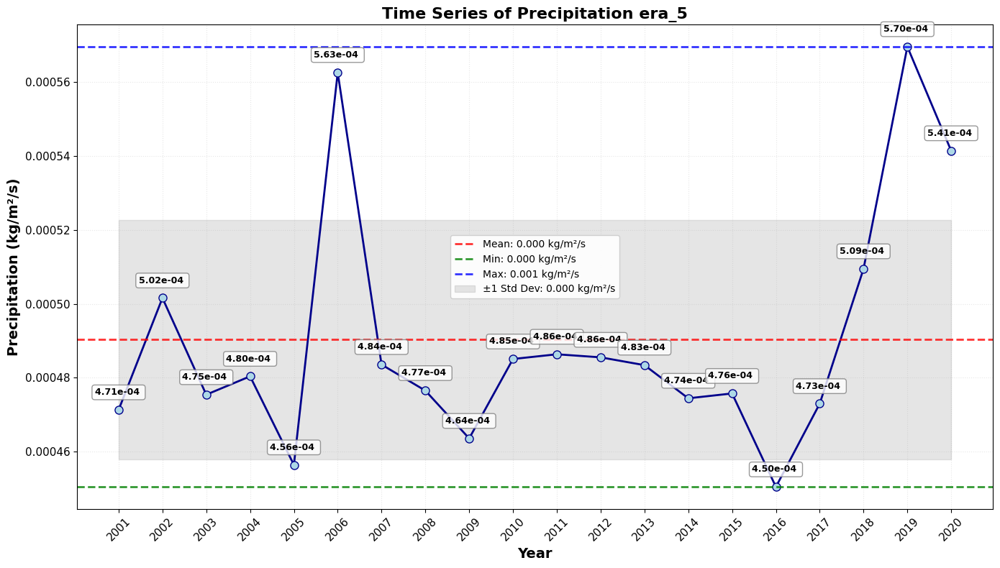


Processing variable: U_Component_of_Wind


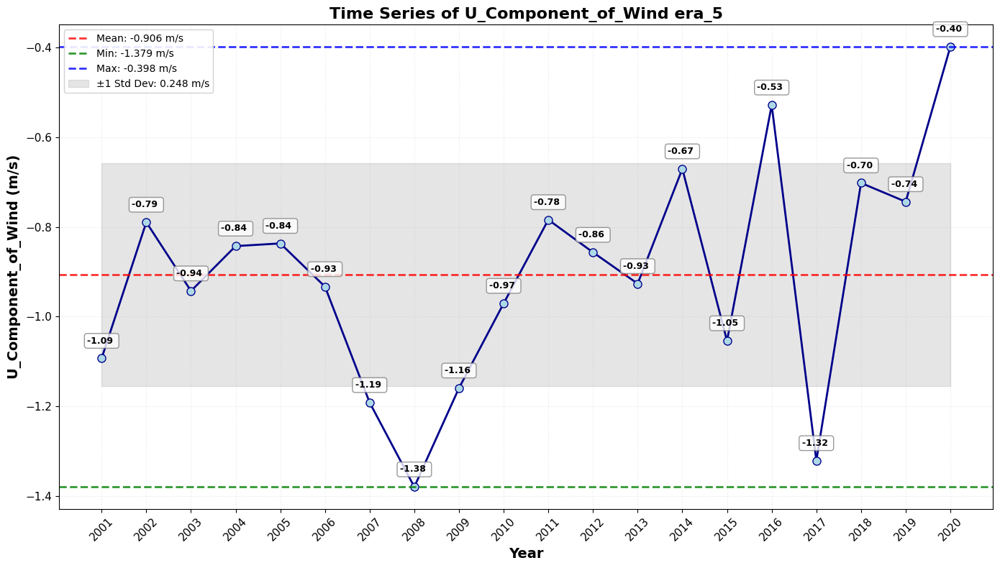


Processing variable: V_Component_of_Wind


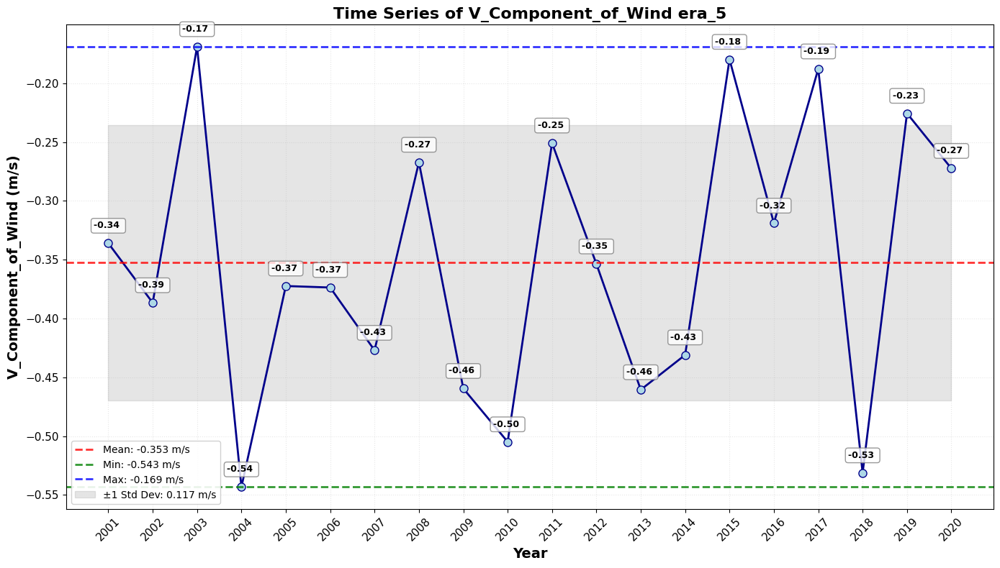


Processing variable: Integrated_Vapor_Transport


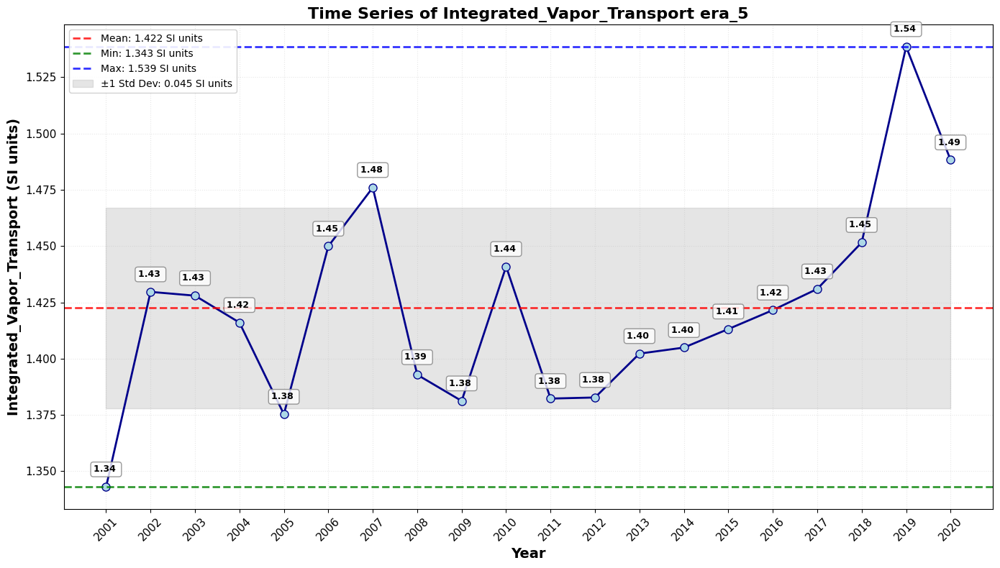

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataframe from the CSV file
df = pd.read_csv('era5_mean_6H_variables.csv')

# Remove the index column if present (more robust way)
if 'Unnamed: 0' in df.columns:
    df = df.drop('Unnamed: 0', axis=1)
elif df.columns[0].startswith('Unnamed'):
    df = df.drop(df.columns[0], axis=1)

# Convert all columns to numeric, handling errors by coercing them to NaN
for col in df.columns:
    if col != 'Year':
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Dictionary with SI units for your specific meteorological variables
UNITS_DICT = {
    'Integrated_Vapor_Transport': 'kg/m²/s',
    'temperature': 'K',
    'geopotential': 'm²/s²',
    'precipitation': 'kg/m²/s',
    'specific_cloud_ice_water_content': 'kg/kg',
    'specific_cloud_liquid_water_content': 'kg/kg',
    'specific_humidity': 'kg/kg',
    'u_component_of_wind': 'm/s',
    'v_component_of_wind': 'm/s'
}

def get_unit_for_variable(var_name):
    """Determine the SI unit for a variable based on its name"""
    var_lower = var_name.lower().replace(' ', '_')

    # Direct mapping for your specific variables
    if var_lower in UNITS_DICT:
        return UNITS_DICT[var_lower]

    # Fallback for partial matches
    for key, unit in UNITS_DICT.items():
        if key in var_lower or var_lower in key:
            return unit

    # Default SI unit if no match found
    return 'SI units'

# Function to plot with annotations and statistics
def plot_with_stats(data, years, title, ylabel):
    # Remove NaN values for statistics calculation
    series = pd.Series(data).dropna()

    if len(series) == 0:
        # print(f"No valid data for {title}")
        return

    # Get appropriate unit for the variable
    unit = get_unit_for_variable(ylabel)

    mean_val = series.mean()
    min_val = series.min()
    max_val = series.max()
    std_val = series.std()

    plt.figure(figsize=(14, 8))

    # Plot the main line with larger markers
    plt.plot(years, data, marker='o', linestyle='-', linewidth=2, markersize=8,
             color='darkblue', markerfacecolor='lightblue', markeredgecolor='darkblue')

    # Add annotations with SI units for ALL points (including NaN handling)
    for i, (year, value) in enumerate(zip(years, data)):
        if not pd.isna(value):
            # Format value based on magnitude and type for better readability
            if unit == 'K':  # Temperature - show more precision
                formatted_value = f'{value:.2f}'
            elif unit == 'kg/kg':  # Specific quantities - show scientific notation if very small
                if abs(value) < 0.001:
                    formatted_value = f'{value:.2e}'
                else:
                    formatted_value = f'{value:.4f}'
            elif unit == 'kg/m²/s':  # Fluxes - show scientific notation if very small
                if abs(value) < 0.001:
                    formatted_value = f'{value:.2e}'
                else:
                    formatted_value = f'{value:.4f}'
            elif unit == 'm²/s²':  # Geopotential - usually large values
                formatted_value = f'{value:.1f}'
            elif unit == 'm/s':  # Wind components
                formatted_value = f'{value:.2f}'
            else:
                # General formatting
                if abs(value) >= 1000:
                    formatted_value = f'{value:.1f}'
                elif abs(value) >= 1:
                    formatted_value = f'{value:.2f}'
                elif abs(value) >= 0.001:
                    formatted_value = f'{value:.4f}'
                else:
                    formatted_value = f'{value:.2e}'

            plt.annotate(f'{formatted_value} ', (year, value),
                        textcoords="offset points", xytext=(0, 15),
                        ha='center', fontsize=9, fontweight='bold',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='white',
                                alpha=0.8, edgecolor='gray'))

    # Add statistical lines with units
    plt.axhline(mean_val, color='red', linestyle='--', linewidth=2,
                label=f'Mean: {mean_val:.3f} {unit}', alpha=0.8)
    plt.axhline(min_val, color='green', linestyle='--', linewidth=2,
                label=f'Min: {min_val:.3f} {unit}', alpha=0.8)
    plt.axhline(max_val, color='blue', linestyle='--', linewidth=2,
                label=f'Max: {max_val:.3f} {unit}', alpha=0.8)

    # Add standard deviation band around mean
    plt.fill_between(years, mean_val - std_val, mean_val + std_val,
                     color='gray', alpha=0.2,
                     label=f'±1 Std Dev: {std_val:.3f} {unit}')

    plt.title(f'{title}', fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14, fontweight='bold')
    plt.ylabel(f'{ylabel} ({unit})', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle=':')
    plt.xticks(list(years), rotation=45 if len(years) > 10 else 0, fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='best', fontsize=10, framealpha=0.9)
    plt.tight_layout()
    plt.show()

    # Print detailed statistics with units
    # print(f"\nDetailed Statistics for {title}:")
    # print(f"  Mean: {mean_val:.4f} {unit}")
    # print(f"  Std Dev: {std_val:.4f} {unit}")
    # print(f"  Min: {min_val:.4f} {unit}")
    # print(f"  Max: {max_val:.4f} {unit}")
    # print(f"  Range: {max_val - min_val:.4f} {unit}")
    # print(f"  Valid values: {len(series)}/{len(data)}")
    # print(f"  Unit detected: {unit}")

    # Print all individual values with years and units
    # print(f"\nAll individual values:")
    # for year, value in zip(years, data):
    #     if not pd.isna(value):
    #         print(f"  {year}: {value:.4f} {unit}")
    #     else:
    #         print(f"  {year}: No data")

# Get years
years = df['Year'].values

# Display basic info about the dataframe
# print("DataFrame Information:")
# print(f"Shape: {df.shape}")
# print(f"Columns: {list(df.columns)}")
# print(f"Years: {years[0]} - {years[-1]}")
# print(f"Number of years: {len(years)}")

# Check for missing values
# print(f"\nMissing values by column:")
for col in df.columns:
    missing = df[col].isna().sum()
    if missing > 0:
        print(f"  {col}: {missing} missing values")

# Plotting for each variable
print(f"\n{'='*50}")
print("GENERATING PLOTS")
print(f"{'='*50}")

for col in df.columns:
    if col != 'Year':
        print(f"\nProcessing variable: {col}")
        plot_with_stats(df[col].values, years,
                       f'Time Series of {col} era_5', col)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataframe from the CSV file
df = pd.read_csv('NGCM_mean_6H_variables.csv')

# Remove the index column if present (more robust way)
if 'Unnamed: 0' in df.columns:
    df = df.drop('Unnamed: 0', axis=1)
elif df.columns[0].startswith('Unnamed'):
    df = df.drop(df.columns[0], axis=1)

# Convert all columns to numeric, handling errors by coercing them to NaN
for col in df.columns:
    if col != 'Year':
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Dictionary with SI units for your specific meteorological variables
UNITS_DICT = {
    'evaporation': 'kg/m²/s',
    'temperature': 'K',
    'geopotential': 'm²/s²',
    'precipitation': 'kg/m²/s',
    'specific_cloud_ice_water_content': 'kg/kg',
    'specific_cloud_liquid_water_content': 'kg/kg',
    'specific_humidity': 'kg/kg',
    'u_component_of_wind': 'm/s',
    'v_component_of_wind': 'm/s',
}

def get_unit_for_variable(var_name):
    """Determine the SI unit for a variable based on its name"""
    var_lower = var_name.lower().replace(' ', '_')

    # Direct mapping for your specific variables
    if var_lower in UNITS_DICT:
        return UNITS_DICT[var_lower]

    # Fallback for partial matches
    for key, unit in UNITS_DICT.items():
        if key in var_lower or var_lower in key:
            return unit

    # Default SI unit if no match found
    return 'SI units'

# Function to plot with annotations and statistics
def plot_with_stats(data, years, title, ylabel):
    # Remove NaN values for statistics calculation
    series = pd.Series(data).dropna()

    if len(series) == 0:
        # print(f"No valid data for {title}")
        return

    # Get appropriate unit for the variable
    unit = get_unit_for_variable(ylabel)

    mean_val = series.mean()
    min_val = series.min()
    max_val = series.max()
    std_val = series.std()

    plt.figure(figsize=(14, 8))

    # Plot the main line with larger markers
    plt.plot(years, data, marker='o', linestyle='-', linewidth=2, markersize=8,
             color='darkblue', markerfacecolor='lightblue', markeredgecolor='darkblue')

    # Add annotations with SI units for ALL points (including NaN handling)
    for i, (year, value) in enumerate(zip(years, data)):
        if not pd.isna(value):
            # Format value based on magnitude and type for better readability
            if unit == 'K':  # Temperature - show more precision
                formatted_value = f'{value:.2f}'
            elif unit == 'kg/kg':  # Specific quantities - show scientific notation if very small
                if abs(value) < 0.001:
                    formatted_value = f'{value:.2e}'
                else:
                    formatted_value = f'{value:.4f}'
            elif unit == 'kg/m²/s':  # Fluxes - show scientific notation if very small
                if abs(value) < 0.001:
                    formatted_value = f'{value:.2e}'
                else:
                    formatted_value = f'{value:.4f}'
            elif unit == 'm²/s²':  # Geopotential - usually large values
                formatted_value = f'{value:.1f}'
            elif unit == 'm/s':  # Wind components
                formatted_value = f'{value:.2f}'
            else:
                # General formatting
                if abs(value) >= 1000:
                    formatted_value = f'{value:.1f}'
                elif abs(value) >= 1:
                    formatted_value = f'{value:.2f}'
                elif abs(value) >= 0.001:
                    formatted_value = f'{value:.4f}'
                else:
                    formatted_value = f'{value:.2e}'

            plt.annotate(f'{formatted_value} ', (year, value),
                        textcoords="offset points", xytext=(0, 15),
                        ha='center', fontsize=9, fontweight='bold',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='white',
                                alpha=0.8, edgecolor='gray'))

    # Add statistical lines with units
    plt.axhline(mean_val, color='red', linestyle='--', linewidth=2,
                label=f'Mean: {mean_val:.3f} {unit}', alpha=0.8)
    plt.axhline(min_val, color='green', linestyle='--', linewidth=2,
                label=f'Min: {min_val:.3f} {unit}', alpha=0.8)
    plt.axhline(max_val, color='blue', linestyle='--', linewidth=2,
                label=f'Max: {max_val:.3f} {unit}', alpha=0.8)

    # Add standard deviation band around mean
    plt.fill_between(years, mean_val - std_val, mean_val + std_val,
                     color='gray', alpha=0.2,
                     label=f'±1 Std Dev: {std_val:.3f} {unit}')

    plt.title(f'{title}', fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14, fontweight='bold')
    plt.ylabel(f'{ylabel} ({unit})', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle=':')
    plt.xticks(list(years), rotation=45 if len(years) > 10 else 0, fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='best', fontsize=10, framealpha=0.9)
    plt.tight_layout()
    plt.show()

    # Print detailed statistics with units
    # print(f"\nDetailed Statistics for {title}:")
    # print(f"  Mean: {mean_val:.4f} {unit}")
    # print(f"  Std Dev: {std_val:.4f} {unit}")
    # print(f"  Min: {min_val:.4f} {unit}")
    # print(f"  Max: {max_val:.4f} {unit}")
    # print(f"  Range: {max_val - min_val:.4f} {unit}")
    # print(f"  Valid values: {len(series)}/{len(data)}")
    # print(f"  Unit detected: {unit}")

    # Print all individual values with years and units
    # print(f"\nAll individual values:")
    # for year, value in zip(years, data):
    #     if not pd.isna(value):
    #         print(f"  {year}: {value:.4f} {unit}")
    #     else:
    #         print(f"  {year}: No data")

# Get years
years = df['Year'].values

# Display basic info about the dataframe
# print("DataFrame Information:")
# print(f"Shape: {df.shape}")
# print(f"Columns: {list(df.columns)}")
# print(f"Years: {years[0]} - {years[-1]}")
# print(f"Number of years: {len(years)}")

# Check for missing values
# print(f"\nMissing values by column:")
for col in df.columns:
    missing = df[col].isna().sum()
    if missing > 0:
        print(f"  {col}: {missing} missing values")

# Plotting for each variable
print(f"\n{'='*50}")
print("GENERATING PLOTS")
print(f"{'='*50}")

for col in df.columns:
    if col != 'Year':
        print(f"\nProcessing variable: {col}")
        plot_with_stats(df[col].values, years,
                       f'Time Series of {col}', col)

# correlation plot

In [ ]:
variables = list(small_data.data_vars)
variables.remove(precip_name)
variables

['geopotential',
 'specific_humidity',
 'temperature',
 'u_component_of_wind',
 'v_component_of_wind',
 'integrated_vapor_transport']

In [ ]:
# # Identify precipitation variable name (commonly 'tp' or 'precip')
# precip_name = [var for var in small_data.data_vars if 'precip' in var or 'tp' in var][0]
# precip = small_data[precip_name]

# # We'll compare spatial correlation with all other variables
# variables = list(small_data.data_vars)
# variables.remove(precip_name)

# correlations = {}

# # Loop over all variables
# for var_name in variables:
#     var = small_data[var_name]

#     # Align time dimension and compute temporal mean at each grid point
#     var_ = var.sel(time=precip.time)

#     # Flatten lat-lon and compute correlation between time series
#     precip_2d = precip.stack(z=("latitude", "longitude"))
#     var_2d = var_.stack(z=("latitude", "longitude"))

#     # Remove nan
#     valid = (~np.isnan(precip_2d)).all("time") & (~np.isnan(var_2d)).all("time")

#     # Compute correlation across time
#     corr = xr.corr(var_2d.sel(z=valid), precip_2d.sel(z=valid), dim="time")

#     correlations[var_name] = corr

# # Display correlations
# for var, corr in correlations.items():
#     print(f"{var} vs {precip_name}: mean corr = {corr.mean().item():.4f}")


In [ ]:
# import seaborn as sns
# import pandas as pd

# corr_df = pd.DataFrame({
#     "Variable": list(correlations.keys()),
#     "Correlation": [c.mean().item() for c in correlations.values()]
# })
# corr_df = corr_df.sort_values("Correlation", ascending=False)

# plt.figure(figsize=(10, 6))
# sns.barplot(data=corr_df, x="Correlation", y="Variable", palette="viridis")
# plt.title("Spatial Correlation vs Precipitation")
# plt.grid(True)
# plt.tight_layout()
# plt.show()


In [ ]:
# #compute the group of variable per year
# temperature_group_year = small_data.temperature.groupby(ds_subset_specific.time.dt.year)
# geopotential_group_year= small_data.geopotential.groupby(ds_subset_specific.time.dt.year)
# precipitation_cumulative_mean_group_year= small_data.total_precipitation_6hr.groupby(ds_subset_specific.time.dt.year)
# specific_humidity_group_year= small_data.specific_humidity.groupby(ds_subset_specific.time.dt.year)
# u_component_of_wind_group_year= small_data.u_component_of_wind.groupby(ds_subset_specific.time.dt.year)
# v_component_of_wind_group_year= small_data.v_component_of_wind.groupby(ds_subset_specific.time.dt.year)
# integrated_vapor_transport_group_year= small_data.integrated_vapor_transport.groupby(ds_subset_specific.time.dt.year)

# # temperature_mean_year=slice(start_date, end_date)
# # # Iterate directly over the grouped object to get group labels and data
# # for year, year_data in tqdm.tqdm(temperature_group_year):
# #   # Calculate the mean for each year's data
# #   # Ensure to remove .values[0] as the mean operation on a DataArray already returns a scalar DataArray if all dimensions are reduced.
# #   temperature_mean_year.append(year_data.mean(dim=('time','longitude','latitude')))

# # # Note: Similar changes should be applied to the loops for other variables (geopotential_group_year, etc.)

In [ ]:
!pip install tqdm

In [ ]:
import tqdm as tqdm
years=range(2001, 2021)
years

range(2001, 2021)

In [ ]:
# temperature_mean_year[]

In [ ]:
temperature_mean_year=[]
for i in tqdm.tqdm(years):
  temperature_mean_year.append(temperature_group_year[i].mean(dim=('time','longitude','latitude')).values)

100%|██████████| 20/20 [3:13:56<00:00, 581.82s/it]


In [ ]:
geopotential_mean_year=[]
for i in tqdm.tqdm(years):
  geopotential_mean_year.append(geopotential_group_year[i].mean(dim=('time','longitude','latitude')).values)

100%|██████████| 20/20 [3:12:45<00:00, 578.27s/it]


In [ ]:
total_precipitation_mean_year=[]
for i in tqdm.tqdm(years):
  total_precipitation_mean_year.append(precipitation_cumulative_mean_group_year[i].mean(dim=('prediction_timedelta','longitude','latitude')).values[0])

  0%|          | 0/20 [00:00<?, ?it/s]


ValueError: 'prediction_timedelta' not found in array dimensions ('time', 'latitude', 'longitude')

In [ ]:
specific_humidity_mean_year=[]
for i in tqdm.tqdm(years):
  specific_humidity_mean_year.append(specific_humidity_group_year[i].mean(dim=('time','longitude','latitude')).values)


[2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]


In [ ]:
u_component_of_wind_mean_year=[]
for i in tqdm.tqdm(years):
  u_component_of_wind_mean_year.append(u_component_of_wind_group_year[i].mean(dim=('time','longitude','latitude')).values)


In [ ]:
v_component_of_wind_mean_year=[]
for i in tqdm.tqdm(years):
  v_component_of_wind_mean_year.append(v_component_of_wind_group_year[i].mean(dim=('time','longitude','latitude')).values)


In [ ]:
integrated_vapor_transport_mean_year=[]
for i in tqdm.tqdm(years):
  integrated_vapor_transport_mean_year.append(integrated_vapor_transport_group_year[i].mean(dim=('time','longitude','latitude')).values)

In [ ]:
# prompt: creer un dataset qui contient toutes les valeurs des variables moyennes calculer

# Create a dictionary to store the mean values for each year and variable
mean_values = {
    'year': list(years),
    'temperature_mean': temperature_mean_year,
    'geopotential_mean': geopotential_mean_year,
    'total_precipitation_mean': total_precipitation_mean_year,
    'specific_humidity_mean': specific_humidity_mean_year,
    'u_component_of_wind_mean': u_component_of_wind_mean_year,
    'v_component_of_wind_mean': v_component_of_wind_mean_year,
    'integrated_vapor_transport_mean': integrated_vapor_transport_mean_year
}

# Create a pandas DataFrame from the dictionary
mean_df = pd.DataFrame(mean_values)

# Display the resulting DataFrame
mean_df


In [ ]:
# prompt: je veux sauvegarder le dataset mean_df dans mon disk interne
mean_df.to_csv('mean_df.csv', index=False)

In [ ]:
# prompt: je veux sauvegarder le dataset mean_df dans mon disk interne  utilise la fonction download

files.download('mean_df.csv')

In [ ]:
# Create a list to store the years
years = list(range(2001, 2022))

# Create empty lists to store the mean values for each variable
evaporation_means = []
temperature_means = []
geopotential_means = []
precipitation_means = []
specific_cloud_ice_water_content_means = []
specific_cloud_liquid_water_content_means = []
specific_humidity_means = []
u_component_of_wind_means = []
v_component_of_wind_means = []


# Assuming evaporation_group_year, etc., are defined as in your provided code
for year_index in tqdm.tqdm(range(len(evaporation_group_year))):
    evaporation_means.append(evaporation_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    temperature_means.append(temperature_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    geopotential_means.append(geopotential_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    precipitation_means.append(precipitation_cumulative_mean_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    specific_cloud_ice_water_content_means.append(specific_cloud_ice_water_content_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    specific_cloud_liquid_water_content_means.append(specific_cloud_liquid_water_content_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    specific_humidity_means.append(specific_humidity_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    u_component_of_wind_means.append(u_component_of_wind_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])
    v_component_of_wind_means.append(v_component_of_wind_group_year[year_index].mean(dim=('prediction_timedelta', 'longitude', 'latitude')).values[0])




In [ ]:
#Create the DataFrame
df = pd.DataFrame({
    'Year': years,
    'Evaporation': evaporation_means,
    'Temperature': temperature_means,
    'Geopotential': geopotential_means,
    'Precipitation': precipitation_means,
    'Specific_Cloud_Ice_Water_Content': specific_cloud_ice_water_content_means,
    'Specific_Cloud_Liquid_Water_Content': specific_cloud_liquid_water_content_means,
    'Specific_Humidity': specific_humidity_means,
    'U_Component_of_Wind': u_component_of_wind_means,
    'V_Component_of_Wind': v_component_of_wind_means,
})

df

In [ ]:

from google.colab import files
df.to_csv('ngcm_mean_variables.csv', encoding = 'utf-8-sig')
files.download('ngcm_mean_variables.csv')


In [ ]:
import pandas as pd
# Load the dataframe from the CSV file
df = pd.read_csv('ngcm_mean_variables.csv')
#remove the index column if present
df = df.drop(df.columns[0], axis=1)
df

,Year,Evaporation,Temperature,Geopotential,Precipitation,Specific_Cloud_Ice_Water_Content,Specific_Cloud_Liquid_Water_Content,Specific_Humidity,U_Component_of_Wind,V_Component_of_Wind
0,2001,-0.000028,266.93768,57505.880,0.400873,1.068847e-06,0.000009,0.001438,1.468133,-0.381264
1,2002,-0.000027,267.35710,57568.625,1.214248,9.435697e-07,0.000009,0.001538,1.563968,-0.309005
2,2003,-0.000026,267.17664,57550.150,2.005824,9.096959e-07,0.000008,0.001414,1.972763,-0.184781
3,2004,-0.000027,267.81772,57620.203,2.811799,8.044467e-07,0.000009,0.001550,1.794583,-0.310050
4,2005,-0.000027,267.56110,57571.730,3.661214,9.641617e-07,0.000009,0.001465,1.783995,-0.216201
5,2006,-0.000028,267.24435,57502.977,4.514099,9.813625e-07,0.000009,0.001535,1.628011,-0.422214
6,2007,-0.000027,266.93057,57444.150,5.325723,9.460319e-07,0.000009,0.001406,1.373758,-0.392004
7,2008,-0.000028,267.10376,57553.690,6.106673,1.014295e-06,0.000009,0.001430,1.991848,-0.495365
8,2009,-0.000028,267.91050,57623.120,6.919768,8.291424e-07,0.000009,0.001488,1.551841,-0.198690
9,2010,-0.000028,267.29526,57480.740,7.693239,9.658954e-07,0.000009,0.001405,1.313283,-0.228710


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataframe from the CSV file
df = pd.read_csv('NGCM_mean_6H_variables.csv')

# Remove the index column if present (more robust way)
if 'Unnamed: 0' in df.columns:
    df = df.drop('Unnamed: 0', axis=1)
elif df.columns[0].startswith('Unnamed'):
    df = df.drop(df.columns[0], axis=1)

# Convert all columns to numeric, handling errors by coercing them to NaN
for col in df.columns:
    if col != 'Year':
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Dictionary with SI units for your specific meteorological variables
UNITS_DICT = {
    'evaporation': 'kg/m²/s',
    'temperature': 'K',
    'geopotential': 'm²/s²',
    'precipitation': 'kg/m²/s',
    'specific_cloud_ice_water_content': 'kg/kg',
    'specific_cloud_liquid_water_content': 'kg/kg',
    'specific_humidity': 'kg/kg',
    'u_component_of_wind': 'm/s',
    'v_component_of_wind': 'm/s'
}

def get_unit_for_variable(var_name):
    """Determine the SI unit for a variable based on its name"""
    var_lower = var_name.lower().replace(' ', '_')

    # Direct mapping for your specific variables
    if var_lower in UNITS_DICT:
        return UNITS_DICT[var_lower]

    # Fallback for partial matches
    for key, unit in UNITS_DICT.items():
        if key in var_lower or var_lower in key:
            return unit

    # Default SI unit if no match found
    return 'SI units'

# Function to plot with annotations and statistics
def plot_with_stats(data, years, title, ylabel):
    # Remove NaN values for statistics calculation
    series = pd.Series(data).dropna()

    if len(series) == 0:
        # print(f"No valid data for {title}")
        return

    # Get appropriate unit for the variable
    unit = get_unit_for_variable(ylabel)

    mean_val = series.mean()
    min_val = series.min()
    max_val = series.max()
    std_val = series.std()

    plt.figure(figsize=(14, 8))

    # Plot the main line with larger markers
    plt.plot(years, data, marker='o', linestyle='-', linewidth=2, markersize=8,
             color='darkblue', markerfacecolor='lightblue', markeredgecolor='darkblue')

    # Add annotations with SI units for ALL points (including NaN handling)
    for i, (year, value) in enumerate(zip(years, data)):
        if not pd.isna(value):
            # Format value based on magnitude and type for better readability
            if unit == 'K':  # Temperature - show more precision
                formatted_value = f'{value:.2f}'
            elif unit == 'kg/kg':  # Specific quantities - show scientific notation if very small
                if abs(value) < 0.001:
                    formatted_value = f'{value:.2e}'
                else:
                    formatted_value = f'{value:.4f}'
            elif unit == 'kg/m²/s':  # Fluxes - show scientific notation if very small
                if abs(value) < 0.001:
                    formatted_value = f'{value:.2e}'
                else:
                    formatted_value = f'{value:.4f}'
            elif unit == 'm²/s²':  # Geopotential - usually large values
                formatted_value = f'{value:.1f}'
            elif unit == 'm/s':  # Wind components
                formatted_value = f'{value:.2f}'
            else:
                # General formatting
                if abs(value) >= 1000:
                    formatted_value = f'{value:.1f}'
                elif abs(value) >= 1:
                    formatted_value = f'{value:.2f}'
                elif abs(value) >= 0.001:
                    formatted_value = f'{value:.4f}'
                else:
                    formatted_value = f'{value:.2e}'

            plt.annotate(f'{formatted_value} ', (year, value),
                        textcoords="offset points", xytext=(0, 15),
                        ha='center', fontsize=9, fontweight='bold',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='white',
                                alpha=0.8, edgecolor='gray'))

    # Add statistical lines with units
    plt.axhline(mean_val, color='red', linestyle='--', linewidth=2,
                label=f'Mean: {mean_val:.3f} {unit}', alpha=0.8)
    plt.axhline(min_val, color='green', linestyle='--', linewidth=2,
                label=f'Min: {min_val:.3f} {unit}', alpha=0.8)
    plt.axhline(max_val, color='blue', linestyle='--', linewidth=2,
                label=f'Max: {max_val:.3f} {unit}', alpha=0.8)

    # Add standard deviation band around mean
    plt.fill_between(years, mean_val - std_val, mean_val + std_val,
                     color='gray', alpha=0.2,
                     label=f'±1 Std Dev: {std_val:.3f} {unit}')

    plt.title(f'{title}', fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14, fontweight='bold')
    plt.ylabel(f'{ylabel} ({unit})', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle=':')
    plt.xticks(list(years), rotation=45 if len(years) > 10 else 0, fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='best', fontsize=10, framealpha=0.9)
    plt.tight_layout()
    plt.show()

    # Print detailed statistics with units
    # print(f"\nDetailed Statistics for {title}:")
    # print(f"  Mean: {mean_val:.4f} {unit}")
    # print(f"  Std Dev: {std_val:.4f} {unit}")
    # print(f"  Min: {min_val:.4f} {unit}")
    # print(f"  Max: {max_val:.4f} {unit}")
    # print(f"  Range: {max_val - min_val:.4f} {unit}")
    # print(f"  Valid values: {len(series)}/{len(data)}")
    # print(f"  Unit detected: {unit}")

    # Print all individual values with years and units
    # print(f"\nAll individual values:")
    # for year, value in zip(years, data):
    #     if not pd.isna(value):
    #         print(f"  {year}: {value:.4f} {unit}")
    #     else:
    #         print(f"  {year}: No data")

# Get years
years = df['Year'].values

# Display basic info about the dataframe
# print("DataFrame Information:")
# print(f"Shape: {df.shape}")
# print(f"Columns: {list(df.columns)}")
# print(f"Years: {years[0]} - {years[-1]}")
# print(f"Number of years: {len(years)}")

# Check for missing values
# print(f"\nMissing values by column:")
for col in df.columns:
    missing = df[col].isna().sum()
    if missing > 0:
        print(f"  {col}: {missing} missing values")

# Plotting for each variable
print(f"\n{'='*50}")
print("GENERATING PLOTS")
print(f"{'='*50}")

for col in df.columns:
    if col != 'Year':
        print(f"\nProcessing variable: {col}")
        plot_with_stats(df[col].values, years,
                       f'Time Series of {col}', col)

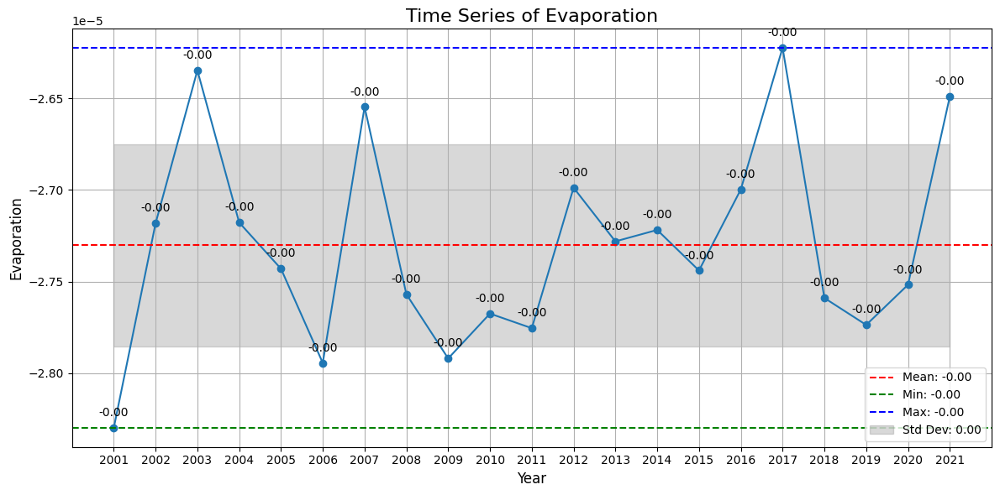

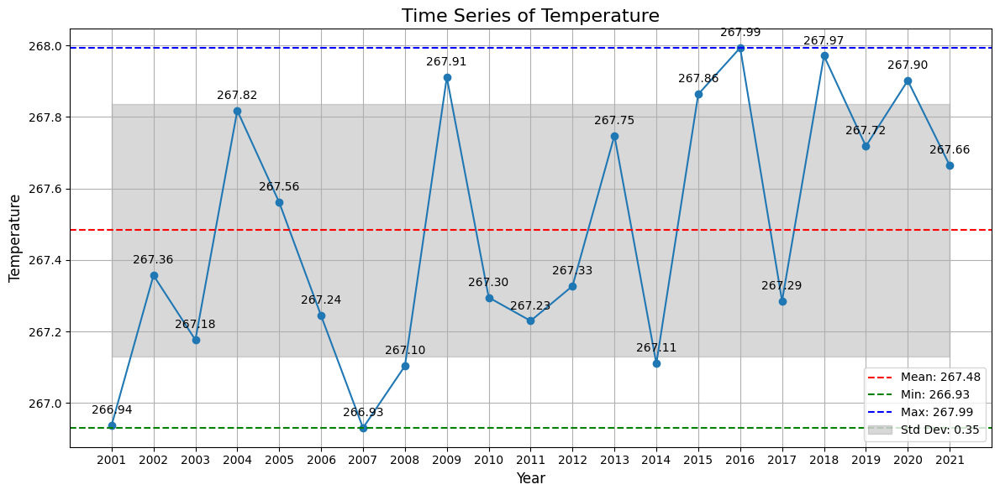

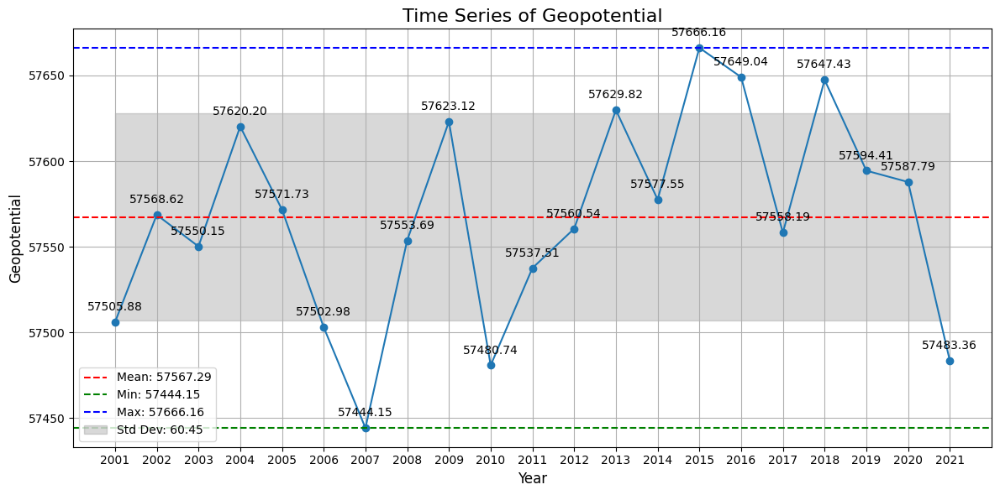

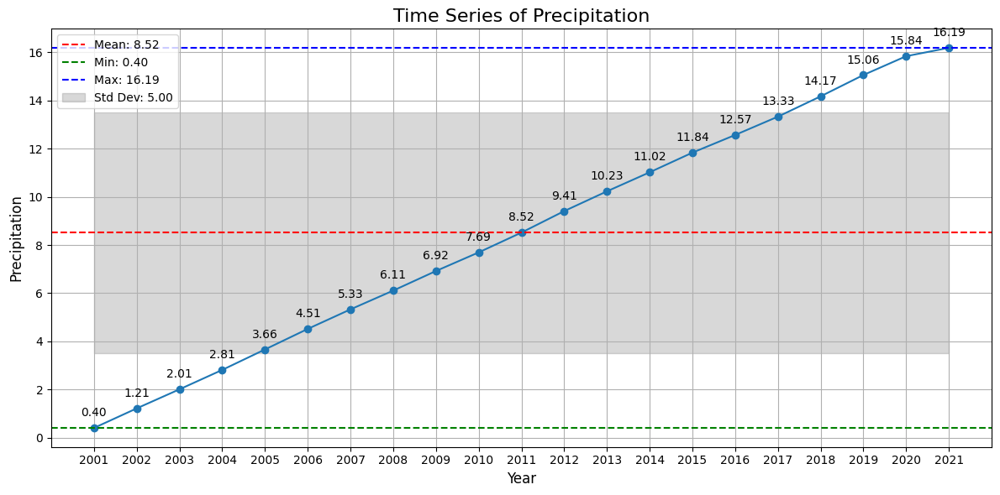

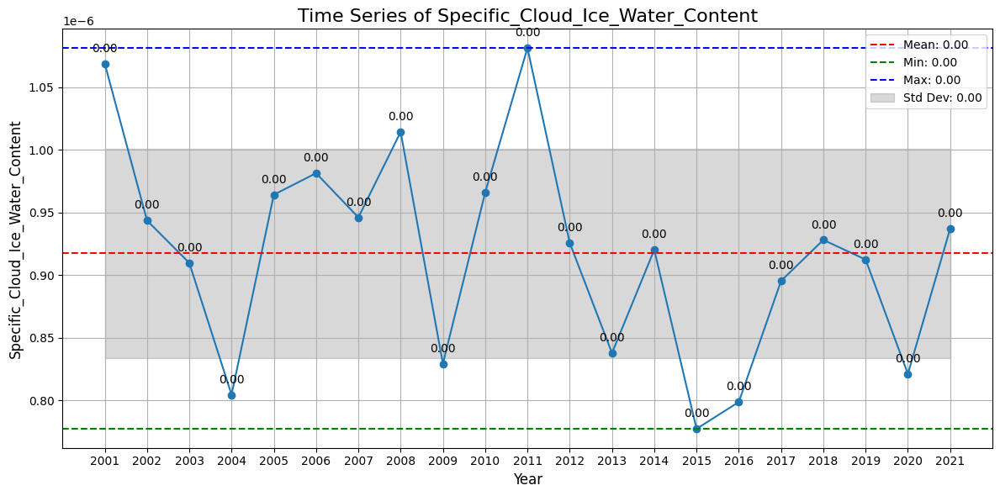

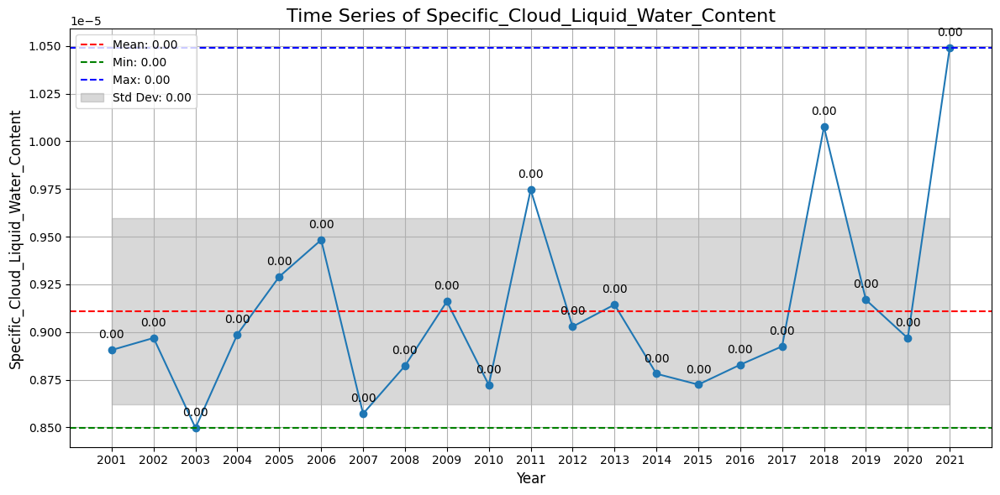

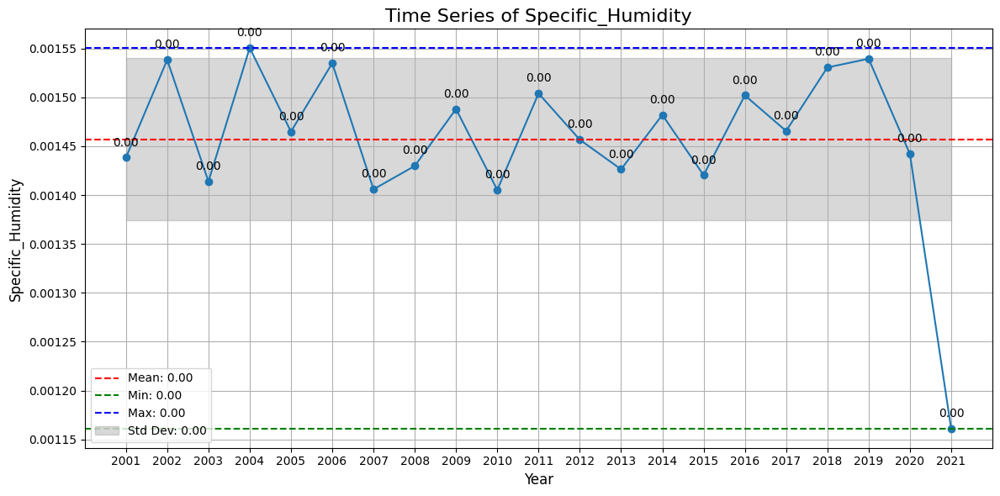

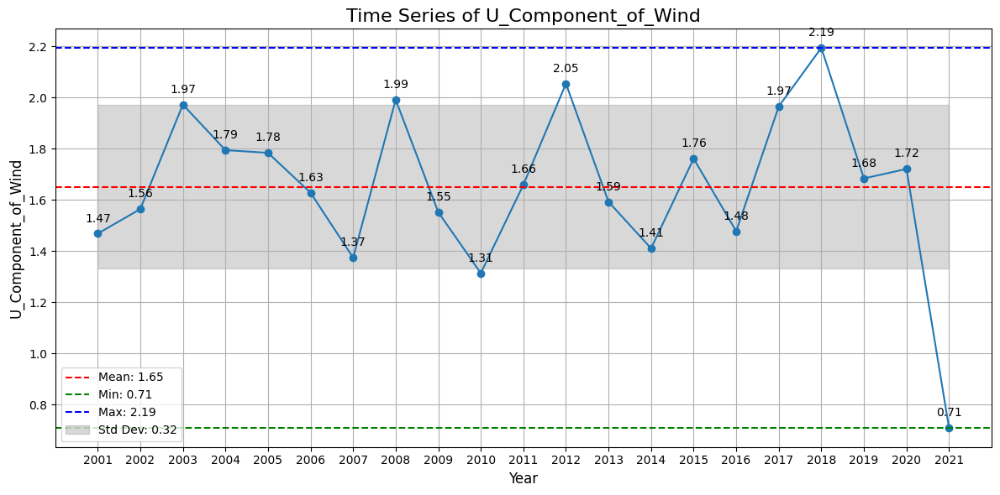

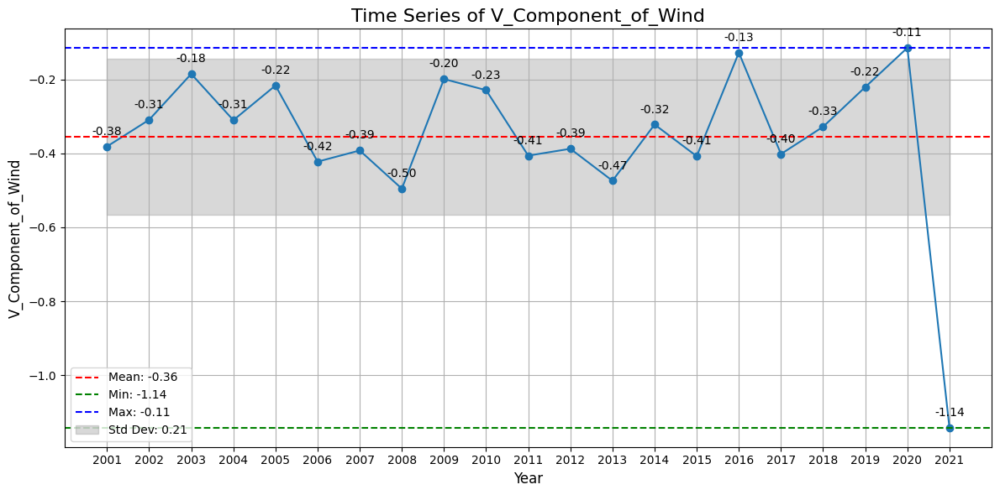

In [ ]:

import matplotlib.pyplot as plt
# Function to plot with annotations and statistics
def plot_with_stats(data, title, ylabel):
    series = pd.Series(data)
    mean_val = series.mean()
    min_val = series.min()
    max_val = series.max()
    std_val = series.std()
    plt.figure(figsize=(12, 6))
    plt.plot(years, series.values, marker='o', linestyle='-')
    for i, year in enumerate(years):
        plt.annotate(f'{data[i]:.2f}', (year, data[i]), textcoords="offset points", xytext=(0, 10), ha='center')
    plt.axhline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
    plt.axhline(min_val, color='green', linestyle='--', label=f'Min: {min_val:.2f}')
    plt.axhline(max_val, color='blue', linestyle='--', label=f'Max: {max_val:.2f}')
    plt.fill_between(years, mean_val - std_val, mean_val + std_val, color='gray', alpha=0.3, label=f'Std Dev: {std_val:.2f}')
    plt.title(title, fontsize=16)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.grid(True)
    plt.xticks(list(years))
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage with the dataframe:
years = df['Year'].values.tolist()

# Plotting for each variables
for col in df.columns:
    if col != 'Year':
        plot_with_stats(df[col].values.tolist(), f'Time Series of {col}', col)
